In [1]:
import os
OUTPUT_DIR = './results'
os.makedirs(OUTPUT_DIR, exist_ok=True)

# **Stage 1: Dataset Acquisition and Loading**

Includes:
- Download dataset from Kaggle and load into the environment.
- Verify directory structure for all 4 class folders.s: Non Demented, Moderate Demented, Mild Demented, and Very Mild Demented.
- Remove corrupted images; index-label image paths before splitting.

In [2]:
import random
import os
import json
import cv2
import joblib
import random
import pywt
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.preprocessing import StandardScaler
from skimage.segmentation import active_contour
from skimage.filters import gaussian
from skimage.draw import polygon
from skimage.feature import local_binary_pattern
from skimage.feature import graycomatrix, graycoprops
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split

random.seed(42)
np.random.seed(42)

In [3]:
# Check the contains of the initial folder
os.listdir('data_alzheimer')

['combined_images']

## **1.1 Verify Folder Directory Structure**

In [4]:
base_path = "data_alzheimer/combined_images"

for root, dirs, files in os.walk(base_path):
    print(root)

data_alzheimer/combined_images
data_alzheimer/combined_images\MildDemented
data_alzheimer/combined_images\ModerateDemented
data_alzheimer/combined_images\NonDemented
data_alzheimer/combined_images\VeryMildDemented


In [5]:
classes = os.listdir(base_path)
print("Classes:", classes)

Classes: ['MildDemented', 'ModerateDemented', 'NonDemented', 'VeryMildDemented']


In [6]:
expected_classes = {
    "NonDemented",
    "VeryMildDemented",
    "MildDemented",
    "ModerateDemented"
}

found_classes = set(classes)
missing = expected_classes - found_classes

if missing:
    print("Missing classes:", missing)
else:
    print("All required classes are present")

All required classes are present


## **1.2 Remove Corrupted Images: Indexing and Labeling Dataset**

In [7]:
def remove_corrupted_images(folder):
    removed = 0
    for root, dirs, files in os.walk(folder):
        for file in files:
            path = os.path.join(root, file)
            try:
                img = Image.open(path)
                img.verify()
            except:
                os.remove(path)
                removed += 1
    print(f"Removed {removed} corrupted images")

remove_corrupted_images(base_path)

Removed 0 corrupted images


In [8]:
data = []
class_names = {
    "NonDemented": 0,
    "VeryMildDemented": 1,
    "MildDemented": 2,
    "ModerateDemented": 3
}

valid_ext = ('.jpg', '.jpeg', '.png')

for class_name, label in class_names.items():
    class_path = os.path.join(base_path, class_name)

    for img in os.listdir(class_path):
        if img.lower().endswith(valid_ext):
            data.append({
                "filepath": os.path.join(class_path, img),
                "label": label,
                "class": class_name
            })

df = pd.DataFrame(data)

In [9]:
df['class'].value_counts()

class
NonDemented         12800
VeryMildDemented    11200
MildDemented        10000
ModerateDemented    10000
Name: count, dtype: int64

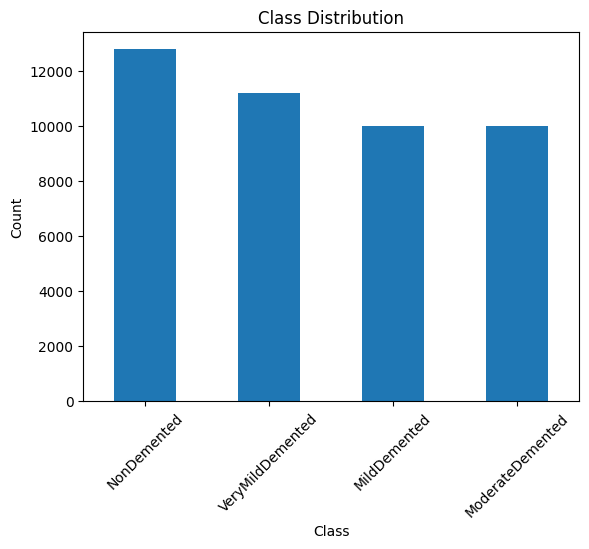

In [10]:
df['class'].value_counts().plot(kind='bar')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

In [11]:
# Shuffle dataset
df = df.sample(frac=1, random_state=42).reset_index(drop=True)

In [12]:
# Preview data
df.head()

,filepath,label,class
0,data_alzheimer/combined_images\ModerateDemente...,3,ModerateDemented
1,data_alzheimer/combined_images\MildDemented\4b...,2,MildDemented
2,data_alzheimer/combined_images\NonDemented\614...,0,NonDemented
3,data_alzheimer/combined_images\ModerateDemente...,3,ModerateDemented
4,data_alzheimer/combined_images\ModerateDemente...,3,ModerateDemented


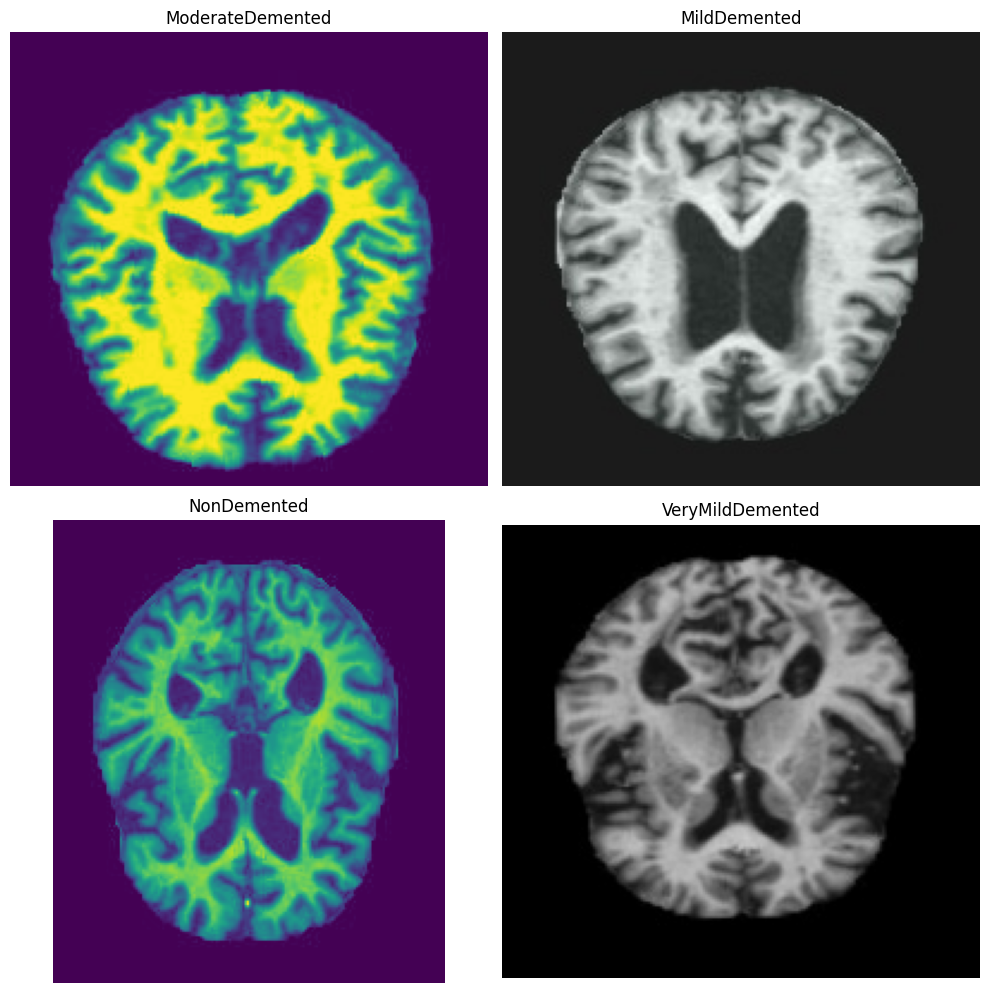

In [13]:
plt.figure(figsize=(10,10))

for i, cls in enumerate(df['class'].unique()):
    sample = df[df['class'] == cls].sample(1).iloc[0]
    img = Image.open(sample['filepath'])

    plt.subplot(2,2,i+1)
    plt.imshow(img)
    plt.title(cls)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [14]:
print("Total data:", len(df))

Total data: 44000


In [15]:
df['class'].value_counts()

class
NonDemented         12800
VeryMildDemented    11200
MildDemented        10000
ModerateDemented    10000
Name: count, dtype: int64

In [16]:
# Missing files check
df['exists'] = df['filepath'].apply(os.path.exists)
print("Missing files:", len(df[df['exists'] == False]))

Missing files: 0


# **Stage 2: Data Preparation**

Includes:
- Stratified splitting (70% train, 15% validation, and 15% test).
- Stratified 5-fold cross-validation to improve reliability and reduce evaluation variance.

## **2.1 Stratified Split 70/15/15**

In [17]:
train_df, temp_df = train_test_split(
    df,
    test_size=0.3,
    stratify=df['label'],
    random_state=42
)

print("Train:", len(train_df))
print("Temp:", len(temp_df))

Train: 30800
Temp: 13200


In [18]:
# Split temp to val and test
val_df, test_df = train_test_split(
    temp_df,
    test_size=0.5,
    stratify=temp_df['label'],
    random_state=42
)

print("Validation:", len(val_df))
print("Test:", len(test_df))

Validation: 6600
Test: 6600


In [19]:
# Distribution check
print("Train Distribution:\n", train_df['class'].value_counts(normalize=True))
print("\nValidation Distribution:\n", val_df['class'].value_counts(normalize=True))
print("\nTest Distribution:\n", test_df['class'].value_counts(normalize=True))

Train Distribution:
 class
NonDemented         0.290909
VeryMildDemented    0.254545
MildDemented        0.227273
ModerateDemented    0.227273
Name: proportion, dtype: float64

Validation Distribution:
 class
NonDemented         0.290909
VeryMildDemented    0.254545
ModerateDemented    0.227273
MildDemented        0.227273
Name: proportion, dtype: float64

Test Distribution:
 class
NonDemented         0.290909
VeryMildDemented    0.254545
ModerateDemented    0.227273
MildDemented        0.227273
Name: proportion, dtype: float64


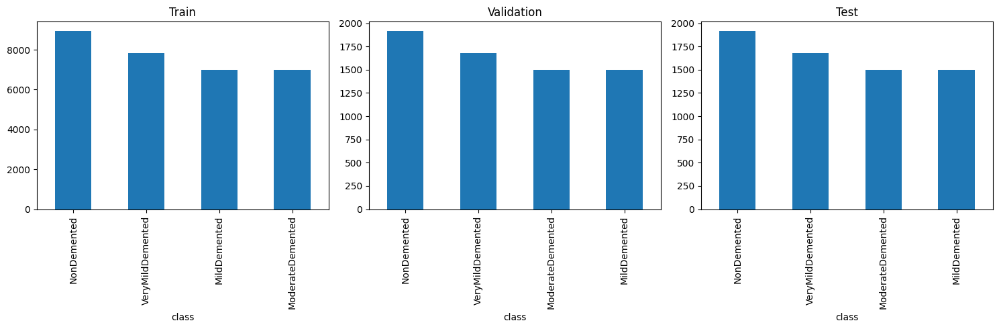

In [20]:
fig, axes = plt.subplots(1, 3, figsize=(15,5))

train_df['class'].value_counts().plot(kind='bar', ax=axes[0], title='Train')
val_df['class'].value_counts().plot(kind='bar', ax=axes[1], title='Validation')
test_df['class'].value_counts().plot(kind='bar', ax=axes[2], title='Test')

plt.tight_layout()
plt.show()

## **2.2 Stratified 5-Fold Cross-Validation**

In [21]:
# Setup stratified k-fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

In [22]:
# Generate fold index
folds = []
for fold, (train_idx, val_idx) in enumerate(skf.split(train_df, train_df['label'])):
    fold_train = train_df.iloc[train_idx]
    fold_val = train_df.iloc[val_idx]

    print(f"\nFold {fold+1}")
    print("Train size:", len(fold_train))
    print("Val size:", len(fold_val))

    folds.append((fold_train, fold_val))


Fold 1
Train size: 24640
Val size: 6160

Fold 2
Train size: 24640
Val size: 6160

Fold 3
Train size: 24640
Val size: 6160

Fold 4
Train size: 24640
Val size: 6160

Fold 5
Train size: 24640
Val size: 6160


In [23]:
# Distribution check per fold
for i, (f_train, f_val) in enumerate(folds):
    print(f"\nFold {i+1} Distribution:")
    print("Train:\n", f_train['class'].value_counts(normalize=True))
    print("Val:\n", f_val['class'].value_counts(normalize=True))


Fold 1 Distribution:
Train:
 class
NonDemented         0.290909
VeryMildDemented    0.254545
MildDemented        0.227273
ModerateDemented    0.227273
Name: proportion, dtype: float64
Val:
 class
NonDemented         0.290909
VeryMildDemented    0.254545
ModerateDemented    0.227273
MildDemented        0.227273
Name: proportion, dtype: float64

Fold 2 Distribution:
Train:
 class
NonDemented         0.290909
VeryMildDemented    0.254545
MildDemented        0.227273
ModerateDemented    0.227273
Name: proportion, dtype: float64
Val:
 class
NonDemented         0.290909
VeryMildDemented    0.254545
ModerateDemented    0.227273
MildDemented        0.227273
Name: proportion, dtype: float64

Fold 3 Distribution:
Train:
 class
NonDemented         0.290909
VeryMildDemented    0.254545
MildDemented        0.227273
ModerateDemented    0.227273
Name: proportion, dtype: float64
Val:
 class
NonDemented         0.290909
VeryMildDemented    0.254545
MildDemented        0.227273
ModerateDemented    0.22

# **Stage 3: Data Preprocessing**

Each raw MRI image is preprocessed sequentially.

| Step | Method | Purpose |
|------|--------|---------|
| 1. | Resize to 128 x 128 px | Standardize spatial dimensions for consistent feature computation |
| 2. | Grayscale Conversion | Reduce unnecessary color complexity,MRI diagnostic info is captured<br>in intensity values |
| 3. | Gaussian Filtering | Suppress high-frequency noise while preserving tissue boundaries |
| 4. | Contrast Limited Adaptive Histogram Equalization (CLAHE) | Enhance local contrast in low-contrast regions, and make subtle<br>cortical texture differences more distinguishable, especially between<br>the Mild and Very Mild classes |
| 5. | Region of Interest (ROI) cropping via Otsu’s Thresholding | Isolate brain tissue from black background; focus extraction on<br>diagnostically relevant regions |

## **3.1 Resize to 128 x 128 px**

In [24]:
sample_path = train_df.iloc[0]['filepath']
img = cv2.imread(sample_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

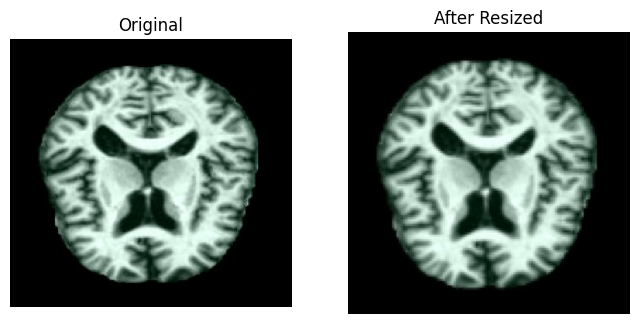

In [25]:
img_resized = cv2.resize(img_rgb, (128, 128))

plt.figure(figsize=(8,4))

plt.subplot(1,2,1)
plt.imshow(img_rgb)
plt.title("Original")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(img_resized)
plt.title("After Resized")
plt.axis('off')

plt.show()

## **3.2 Grayscale Conversion**

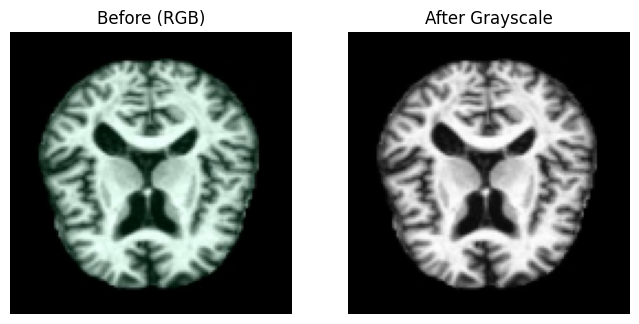

In [26]:
img_gray = cv2.cvtColor(img_resized, cv2.COLOR_RGB2GRAY)

plt.figure(figsize=(8,4))

plt.subplot(1,2,1)
plt.imshow(img_resized)
plt.title("Before (RGB)")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(img_gray, cmap='gray')
plt.title("After Grayscale")
plt.axis('off')

plt.show()

## **3.3 Gaussian Filtering**

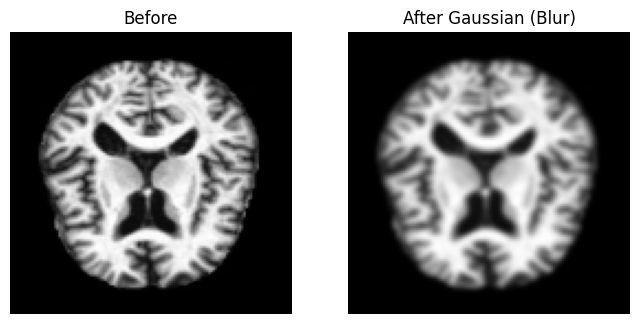

In [27]:
img_blur = cv2.GaussianBlur(img_gray, (5,5), 0)

plt.figure(figsize=(8,4))

plt.subplot(1,2,1)
plt.imshow(img_gray, cmap='gray')
plt.title("Before")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(img_blur, cmap='gray')
plt.title("After Gaussian (Blur)")
plt.axis('off')

plt.show()

## **3.4 Contrast Limited Adaptive Histogram Equalization (CLAHE)**

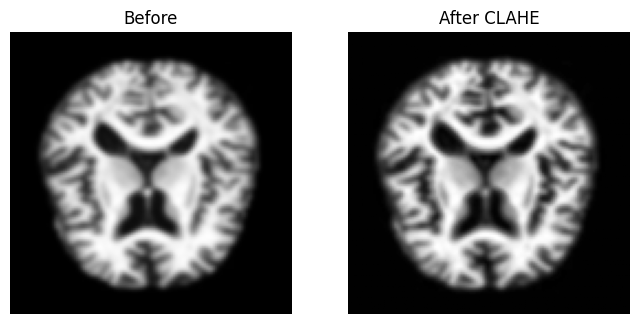

In [28]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
img_clahe = clahe.apply(img_blur)

plt.figure(figsize=(8,4))

plt.subplot(1,2,1)
plt.imshow(img_blur, cmap='gray')
plt.title("Before")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(img_clahe, cmap='gray')
plt.title("After CLAHE")
plt.axis('off')

plt.show()

## **3.5 Brain Region Segmentation via Active Contour (Snake)**

In [29]:
sample_path = train_df.iloc[0]['filepath']
img_raw = cv2.imread(sample_path)
img_raw = cv2.resize(img_raw, (128, 128))
img_gray_s = cv2.cvtColor(img_raw, cv2.COLOR_BGR2GRAY)
img_blur_s = cv2.GaussianBlur(img_gray_s, (5, 5), 0)
clahe_s = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
img_clahe_s = clahe_s.apply(img_blur_s)

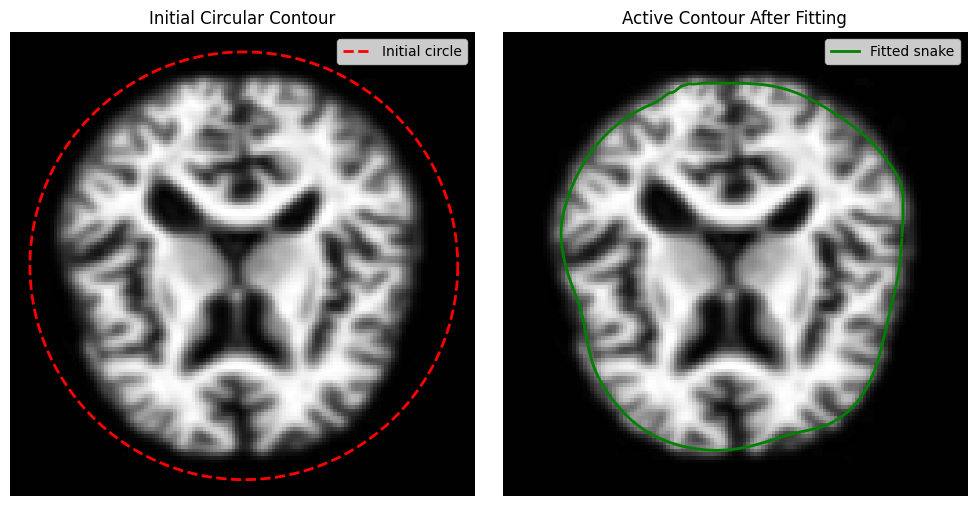

In [30]:
# Initialize a circular snake contour centered on the image
img_float = img_clahe_s / 255.0
img_smooth = gaussian(img_float, sigma=3)

# Circular initialization centered at image center
h, w = img_float.shape
cy, cx = h // 2, w // 2
r_init = min(h, w) // 2 - 5
s = np.linspace(0, 2 * np.pi, 400)
init_x = cx + r_init * np.cos(s)
init_y = cy + r_init * np.sin(s)
init_contour = np.array([init_y, init_x]).T

# Run active contour
snake = active_contour(
    img_smooth,
    init_contour,
    alpha=0.015,   
    beta=10,       
    gamma=0.001,   
    w_line=0,
    w_edge=1,
    max_num_iter=200
)

# Visualize initial circle vs. fitted snake
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(img_clahe_s, cmap='gray')
axes[0].plot(init_contour[:, 1], init_contour[:, 0], '--r', lw=2, label='Initial circle')
axes[0].set_title('Initial Circular Contour')
axes[0].axis('off')
axes[0].legend(loc='upper right')
axes[1].imshow(img_clahe_s, cmap='gray')
axes[1].plot(snake[:, 1], snake[:, 0], '-g', lw=2, label='Fitted snake')
axes[1].set_title('Active Contour After Fitting')
axes[1].axis('off')
axes[1].legend(loc='upper right')

plt.tight_layout()
plt.show()

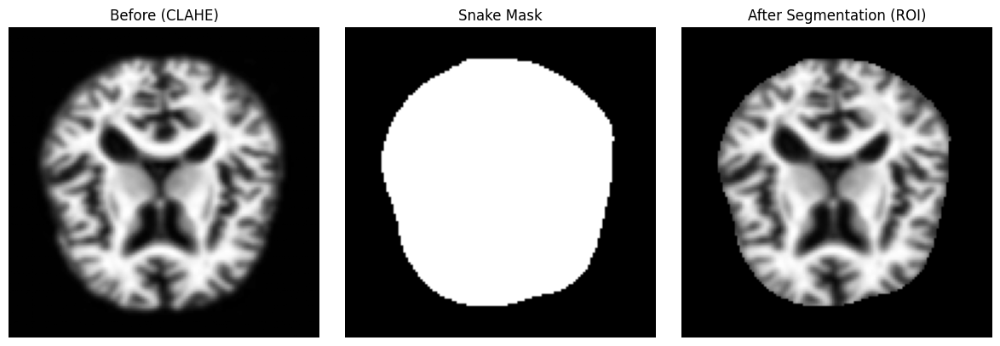

In [31]:
# Create binary mask from fitted snake contour and apply to image
mask_snake = np.zeros_like(img_clahe_s, dtype=np.uint8)
rr, cc = polygon(snake[:, 0].astype(int), snake[:, 1].astype(int), img_clahe_s.shape)
rr = np.clip(rr, 0, img_clahe_s.shape[0] - 1)
cc = np.clip(cc, 0, img_clahe_s.shape[1] - 1)
mask_snake[rr, cc] = 255

# Apply mask to CLAHE image
img_snake_roi = cv2.bitwise_and(img_clahe_s, img_clahe_s, mask=mask_snake)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(img_clahe_s, cmap='gray')
axes[0].set_title('Before (CLAHE)')
axes[0].axis('off')
axes[1].imshow(mask_snake, cmap='gray')
axes[1].set_title('Snake Mask')
axes[1].axis('off')
axes[2].imshow(img_snake_roi, cmap='gray')
axes[2].set_title('After Segmentation (ROI)')
axes[2].axis('off')

plt.tight_layout()
plt.show()

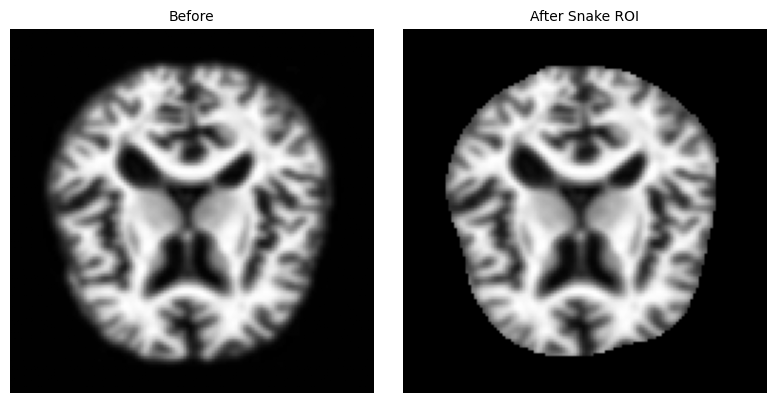

In [32]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(img_clahe_s, cmap='gray')
axes[0].set_title('Before', fontsize=10); axes[0].axis('off')
axes[1].imshow(img_snake_roi, cmap='gray')
axes[1].set_title('After Snake ROI', fontsize=10); axes[1].axis('off')
plt.tight_layout(); plt.show()

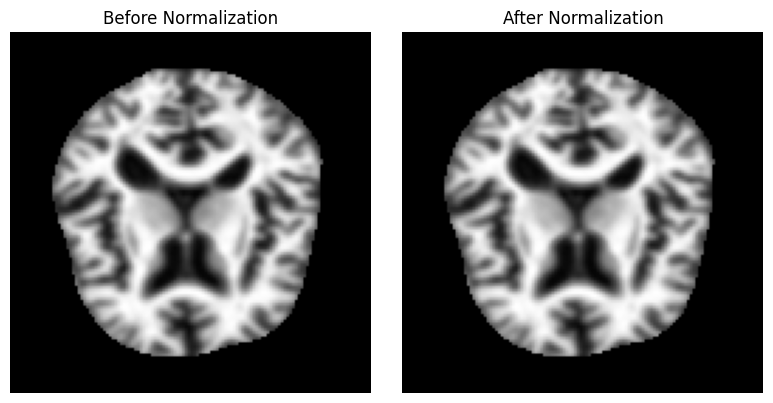

In [33]:
# Normalization after segmentation
img_snake_norm = img_snake_roi / 255.0

fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(img_snake_roi, cmap='gray')
axes[0].set_title('Before Normalization')
axes[0].axis('off')

axes[1].imshow(img_snake_norm, cmap='gray')
axes[1].set_title('After Normalization')
axes[1].axis('off')

plt.tight_layout()
plt.show()

In [34]:
# Final preprocessing function
def preprocess_image(path, size=128):
    img = cv2.imread(path)
    img = cv2.resize(img, (size, size))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl = clahe.apply(blur)

    # Active contour segmentation
    img_float = cl / 255.0
    img_smooth = gaussian(img_float, sigma=3)

    h, w = img_float.shape
    cy, cx = h // 2, w // 2
    r_init = min(h, w) // 2 - 5
    s = np.linspace(0, 2 * np.pi, 200)
    init_contour = np.array([cy + r_init * np.cos(s),
                              cx + r_init * np.sin(s)]).T

    snake = active_contour(
        img_smooth, init_contour,
        alpha=0.015, beta=10, gamma=0.001,
        w_line=0, w_edge=1, max_num_iter=100
    )

    mask = np.zeros((h, w), dtype=np.uint8)
    rr, cc = polygon(snake[:, 0].astype(int), snake[:, 1].astype(int), (h, w))
    rr = np.clip(rr, 0, h - 1)
    cc = np.clip(cc, 0, w - 1)
    mask[rr, cc] = 255

    masked = cv2.bitwise_and(cl, cl, mask=mask)
    norm = masked / 255.0
    return norm

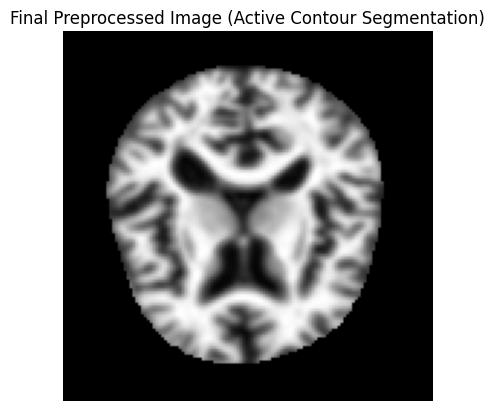

In [35]:
# Test updated preprocess_image function
test_img = preprocess_image(train_df.iloc[0]['filepath'])

plt.imshow(test_img, cmap='gray')
plt.title('Final Preprocessed Image (Active Contour Segmentation)')
plt.axis('off')
plt.show()

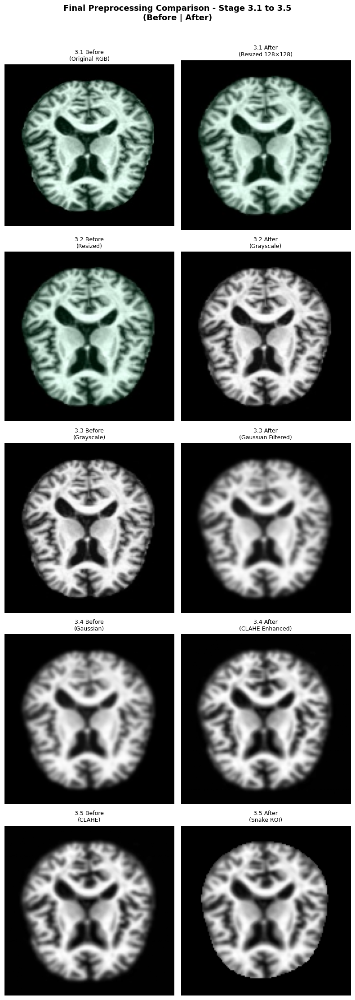

In [36]:
from skimage.filters import gaussian as sk_gaussian

sp = train_df.iloc[0]['filepath']
i_rgb = cv2.cvtColor(cv2.imread(sp), cv2.COLOR_BGR2RGB)
i_res  = cv2.resize(i_rgb, (128,128))
i_gray = cv2.cvtColor(i_res, cv2.COLOR_RGB2GRAY)
i_blur = cv2.GaussianBlur(i_gray, (5,5), 0)
_c = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
i_cl = _c.apply(i_blur)
_f = i_cl/255.0; _sm = sk_gaussian(_f, sigma=3)
h,w = _f.shape; cy,cx=h//2,w//2; ri=min(h,w)//2-5
s_ = np.linspace(0,2*np.pi,200)
ic = np.array([cy+ri*np.cos(s_), cx+ri*np.sin(s_)]).T
_sk = active_contour(_sm, ic, alpha=0.015, beta=10, gamma=0.001,
                     w_line=0, w_edge=1, max_num_iter=100)
_mk = np.zeros((h,w), dtype=np.uint8)
rr,cc = polygon(_sk[:,0].astype(int), _sk[:,1].astype(int), (h,w))
rr,cc = np.clip(rr,0,h-1), np.clip(cc,0,w-1)
_mk[rr,cc]=255
i_roi = cv2.bitwise_and(i_cl, i_cl, mask=_mk)

bfr = [i_rgb, i_res, i_gray, i_blur, i_cl]
aft = [i_res, i_gray, i_blur, i_cl, i_roi]
lb = ['3.1 Before\n(Original RGB)','3.2 Before\n(Resized)','3.3 Before\n(Grayscale)',
       '3.4 Before\n(Gaussian)','3.5 Before\n(CLAHE)']
la = ['3.1 After\n(Resized 128×128)','3.2 After\n(Grayscale)','3.3 After\n(Gaussian Filtered)',
       '3.4 After\n(CLAHE Enhanced)','3.5 After\n(Snake ROI)']
cmb = [None,None,'gray','gray','gray']
cma = [None,'gray','gray','gray','gray']

fig, axes = plt.subplots(5, 2, figsize=(8, 22))
fig.suptitle('Final Preprocessing Comparison - Stage 3.1 to 3.5\n(Before | After)',
             fontsize=13, fontweight='bold', y=1.01)
for r in range(5):
    axes[r,0].imshow(bfr[r], cmap=cmb[r]); axes[r,0].set_title(lb[r], fontsize=9); axes[r,0].axis('off')
    axes[r,1].imshow(aft[r], cmap=cma[r]); axes[r,1].set_title(la[r], fontsize=9); axes[r,1].axis('off')
plt.tight_layout(); plt.show()

# **Stage 4: Data Augmentation**

Applied to training data only to improve generalization:
- Random rotation (±15°)
- Horizontal flipping
- Zoom (±10%)
- Gaussian noise injection
- Brightness adjustment

## **4.1 Random Rotation**

In [37]:
sample_path = train_df.iloc[0]['filepath']
img = preprocess_image(sample_path)

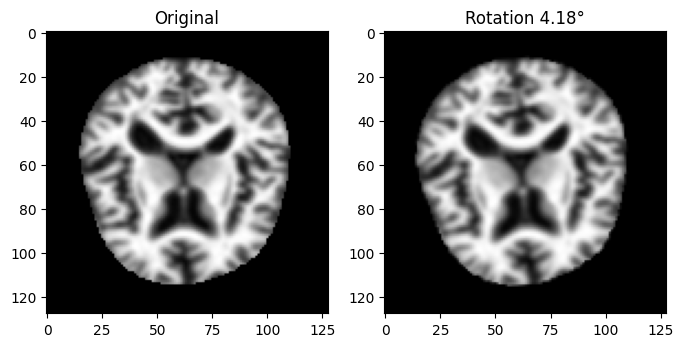

In [38]:
def random_rotation(image, max_angle=15):
    angle = random.uniform(-max_angle, max_angle)

    h, w = image.shape
    M = cv2.getRotationMatrix2D((w//2, h//2), angle, 1)
    rotated = cv2.warpAffine(image, M, (w, h))

    return rotated, angle

img_rot, angle = random_rotation(img)

plt.figure(figsize=(8,4))

plt.subplot(1,2,1)
plt.imshow(img, cmap='gray')
plt.title("Original")

plt.subplot(1,2,2)
plt.imshow(img_rot, cmap='gray')
plt.title(f"Rotation {angle:.2f}°")

plt.show()

## **4.2 Horizontal Flipping**

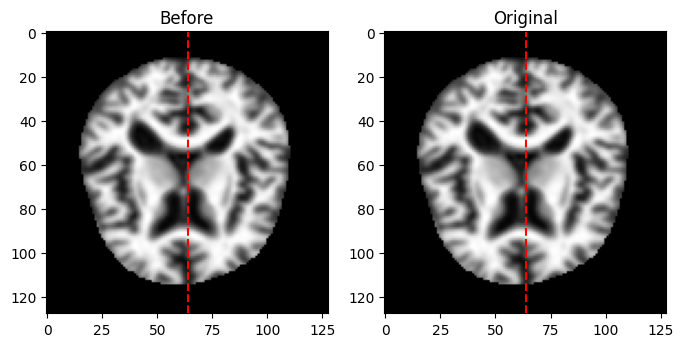

In [39]:
def random_flip(image):
    if random.random() > 0.5:
        return cv2.flip(image, 1), "Flipped"
    else:
        return image, "Original"

img_flip, status = random_flip(img)

h, w = img.shape
mid_x = w // 2

plt.figure(figsize=(8,4))

plt.subplot(1,2,1)
plt.imshow(img, cmap='gray')
plt.axvline(x=mid_x, color='red', linestyle='--')
plt.title("Before")

plt.subplot(1,2,2)
plt.imshow(img_flip, cmap='gray')
plt.axvline(x=mid_x, color='red', linestyle='--')
plt.title(status)

plt.show()

## **4.3 Zoom**

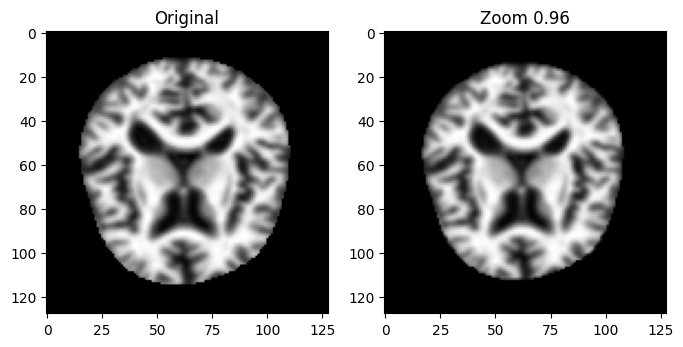

In [40]:
def random_zoom(image, zoom_range=0.1):
    h, w = image.shape

    zoom_factor = 1 + random.uniform(-zoom_range, zoom_range)

    if zoom_factor > 1:
        new_h, new_w = int(h / zoom_factor), int(w / zoom_factor)

        y1 = (h - new_h) // 2
        x1 = (w - new_w) // 2

        cropped = image[y1:y1+new_h, x1:x1+new_w]
        zoomed = cv2.resize(cropped, (w, h))

    else:
        new_h, new_w = int(h * zoom_factor), int(w * zoom_factor)

        resized = cv2.resize(image, (new_w, new_h))

        top = (h - new_h) // 2
        bottom = h - new_h - top
        left = (w - new_w) // 2
        right = w - new_w - left

        zoomed = cv2.copyMakeBorder(
            resized, top, bottom, left, right,
            cv2.BORDER_CONSTANT, value=0
        )

    return zoomed, zoom_factor

img_zoom, zf = random_zoom(img)

plt.figure(figsize=(8,4))

plt.subplot(1,2,1)
plt.imshow(img, cmap='gray')
plt.title("Original")

plt.subplot(1,2,2)
plt.imshow(img_zoom, cmap='gray')
plt.title(f"Zoom {zf:.2f}")

plt.show()

## **4.4.Gaussian Noise Injection**

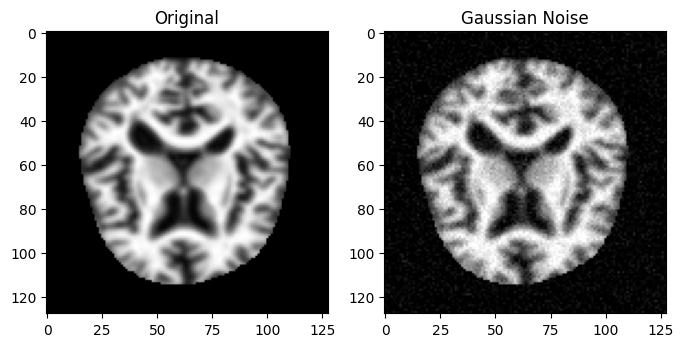

In [41]:
def random_noise(image, noise_level=0.05):
    noise = np.random.normal(0, noise_level, image.shape)
    noisy = image + noise
    noisy = np.clip(noisy, 0, 1)

    return noisy

img_noise = random_noise(img)

plt.figure(figsize=(8,4))

plt.subplot(1,2,1)
plt.imshow(img, cmap='gray')
plt.title("Original")

plt.subplot(1,2,2)
plt.imshow(img_noise, cmap='gray')
plt.title("Gaussian Noise")

plt.show()

## **4.5 Brightness adjustment**

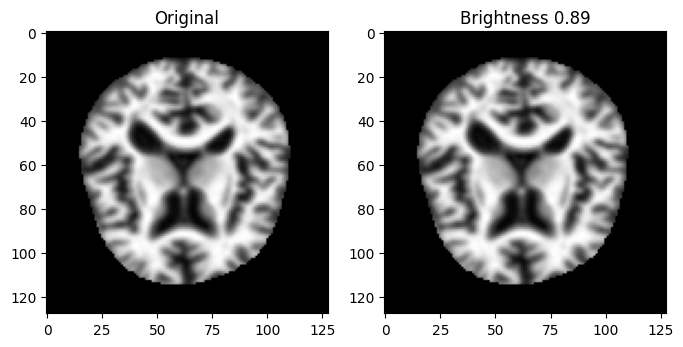

In [42]:
def random_brightness(image, range_val=0.2):
    factor = 1 + random.uniform(-range_val, range_val)
    bright = image * factor
    bright = np.clip(bright, 0, 1)

    return bright, factor

img_bright, bf = random_brightness(img)

plt.figure(figsize=(8,4))

plt.subplot(1,2,1)
plt.imshow(img, cmap='gray')
plt.title("Original")

plt.subplot(1,2,2)
plt.imshow(img_bright, cmap='gray')
plt.title(f"Brightness {bf:.2f}")

plt.show()

In [43]:
# Final augmentation function
def augment_image(image):
    image, _ = random_rotation(image)
    image, _ = random_zoom(image)
    image, _ = random_brightness(image)
    image = random_noise(image)
    image, _ = random_flip(image)
    return image

In [44]:
def generate_augmented_data(df, augment=True):
    X, y = [], []

    for _, row in df.iterrows():
        img = preprocess_image(row['filepath'])

        X.append(img)
        y.append(row['label'])

        if augment:
            for _ in range(2):
                aug_img = augment_image(img)
                X.append(aug_img)
                y.append(row['label'])

    return np.array(X), np.array(y)

# **Stage 5: Conventional Feature Extraction**

3 conventional feature extraction methods are applied in parallel to each preprocessed image, then combined into a single normalized feature vector.
| Method | Configuration | Output |
|--------|--------------|--------|
| Gabor Filter Bank | 8 orientations (0°–157.5°),<br>5 frequency scales per image | 4 descriptors per response: mean,<br>variance, energy, entropy |
| Local Binary Pattern (LBP) | Multi-radius: r = 1, 2, 3<br>with 8 sampling points per radius | Normalized uniform LBP histograms<br>per-radius, concatenated |
| Gray-Level Co-occurrence Matrix (GLCM) | Co-occurrence matrices at 4 angles:<br>0°, 45°, 90°, 135° | 4 Haralick features per matrix:<br>contrast, correlation, energy, <br>homogeneity |
| Feature Vector Construction | Concatenation of all Gabor + LBP + GLCM features | ~300-dim normalized vector<br>(StandardScaler) |
- Gabor is selected because it captures orientation-sensitive edge and ridge patterns in cortisol tissue that progressively degrade with Alzheimer’s severity [3].
- LBP is selected because it encodes local microstructural tissue patterns at multiple spatial scales and is robust to illumination variation and minor rotational differences that are commonly found between MRI scans of different subjects [4].
- GLCM is selected because it captures the spatial intensity relationship between neighboring pixel intensities and reflects cortical structural coherence, which diminishes with neurodegeneration [10].
Feature Vector Construction then constructed and resulting vector of
- 300 dimensions, then being normalized using StandardScaler to eliminate scale dominance from any single feature subspace.

## **5.1 Gabor Filter Bank**

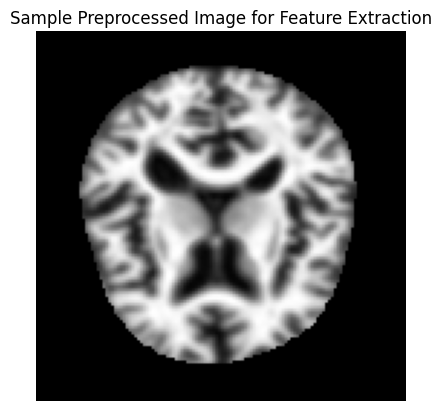

Image shape: (128, 128) | dtype: float64


In [45]:
# Load and preprocess a sample image
sample_path = train_df.iloc[0]['filepath']
sample_img = preprocess_image(sample_path)

plt.imshow(sample_img, cmap='gray')
plt.title('Sample Preprocessed Image for Feature Extraction')
plt.axis('off')
plt.show()
print('Image shape:', sample_img.shape, '| dtype:', sample_img.dtype)

In [46]:
# Build Gabor filter bank
def build_gabor_bank(orientations=8, scales=5, ksize=21, sigma=4.0, gamma=0.5, psi=0):
    filters = []
    wavelengths = np.logspace(np.log10(4), np.log10(32), scales)

    for theta_idx in range(orientations):
        theta = theta_idx * np.pi / orientations
        for lam in wavelengths:
            kernel = cv2.getGaborKernel(
                (ksize, ksize),
                sigma=sigma,
                theta=theta,
                lambd=lam,
                gamma=gamma,
                psi=psi,
                ktype=cv2.CV_64F
            )
            kernel /= (kernel.sum() + 1e-10)  # normalize
            filters.append((kernel, theta, lam))

    return filters

gabor_bank = build_gabor_bank()
print('Total Gabor filters:', len(gabor_bank))

Total Gabor filters: 40


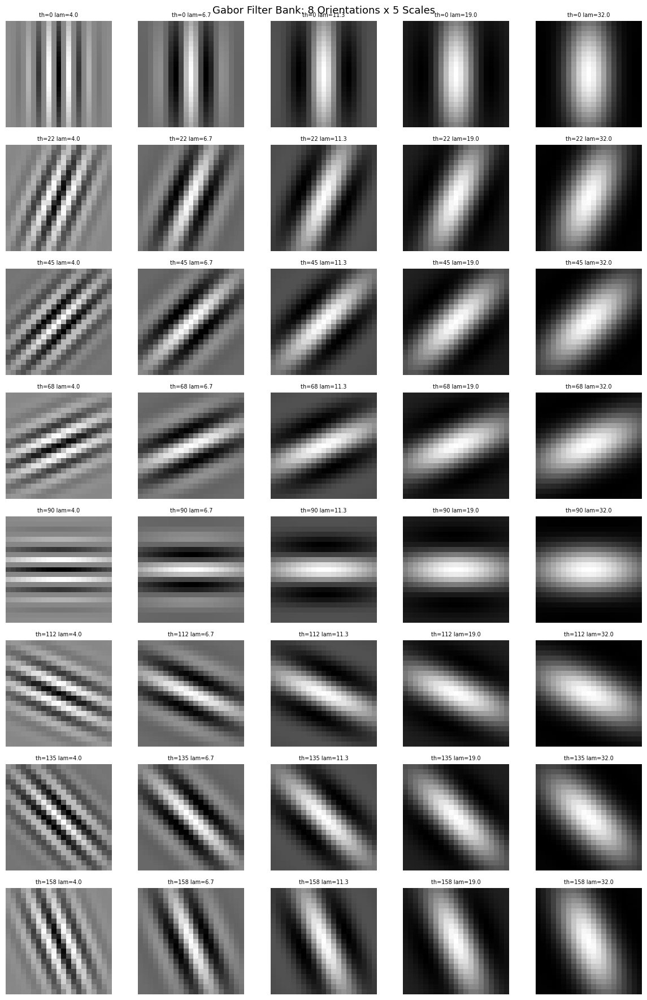

In [47]:
# Visualize the Gabor filter bank
fig, axes = plt.subplots(8, 5, figsize=(12, 18))
fig.suptitle('Gabor Filter Bank: 8 Orientations x 5 Scales', fontsize=13)

for idx, (kernel, theta, lam) in enumerate(gabor_bank):
    row, col = idx // 5, idx % 5
    axes[row, col].imshow(kernel, cmap='gray')
    axes[row, col].set_title(
        f'th={np.degrees(theta):.0f} lam={lam:.1f}',
        fontsize=7
    )
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

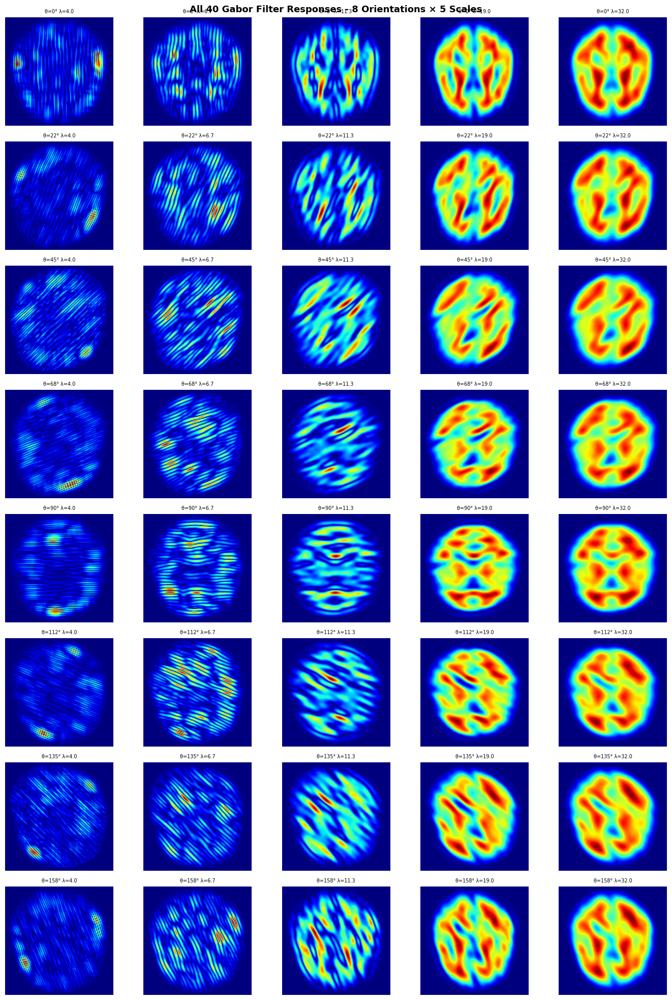

In [48]:
# Visualize all 40 Gabor Filter Responses (8 orientations × 5 scales)
img_uint8_40 = (sample_img * 255).astype(np.uint8)
fig, axes = plt.subplots(8, 5, figsize=(14, 20))
fig.suptitle('All 40 Gabor Filter Responses - 8 Orientations × 5 Scales',
             fontsize=13, fontweight='bold')
for idx40 in range(40):
    kernel, theta, lam = gabor_bank[idx40]
    resp = np.abs(cv2.filter2D(img_uint8_40, cv2.CV_64F, kernel))
    r40, c40 = idx40 // 5, idx40 % 5
    axes[r40, c40].imshow(resp, cmap='jet')
    axes[r40, c40].set_title(f'θ={np.degrees(theta):.0f}° λ={lam:.1f}', fontsize=7)
    axes[r40, c40].axis('off')
plt.tight_layout(); plt.show()

In [49]:
# Enhanced Gabor feature extraction (12 orientations × 7 scales, 336 features)
def build_gabor_bank(orientations=12, scales=7, ksize=21, sigma=4.0, gamma=0.5, psi=0):
    filters = []
    wavelengths = np.logspace(np.log10(3), np.log10(40), scales)
    for theta_idx in range(orientations):
        theta = theta_idx * np.pi / orientations
        for lam in wavelengths:
            kernel = cv2.getGaborKernel(
                (ksize, ksize), sigma=sigma, theta=theta,
                lambd=lam, gamma=gamma, psi=psi, ktype=cv2.CV_64F
            )
            kernel /= (kernel.sum() + 1e-10)
            filters.append((kernel, theta, lam))
    return filters

gabor_bank = build_gabor_bank()
print('Total Gabor filters:', len(gabor_bank))
print('Expected: 84  (12 orientations x 7 scales)')

def extract_gabor_features(image, gabor_bank=gabor_bank):
    img_uint8 = (image * 255).astype(np.uint8) if image.max() <= 1.0 else image.astype(np.uint8)
    features = []
    for kernel, _, _ in gabor_bank:
        response = cv2.filter2D(img_uint8, cv2.CV_64F, kernel)
        mag = np.abs(response).ravel()
        mean = np.mean(mag)
        var = np.var(mag)
        energy = np.sum(mag ** 2)
        prob = (mag + 1e-10) / (mag.sum() + 1e-10)
        entropy = -np.sum(prob * np.log(prob + 1e-10))
        features.extend([mean, var, energy, entropy])
    return np.array(features, dtype=np.float32)


Total Gabor filters: 84
Expected: 84  (12 orientations x 7 scales)


In [50]:
# Test enhanced Gabor feature extraction
gabor_feat_sample = extract_gabor_features(sample_img)
print('Gabor feature vector shape:', gabor_feat_sample.shape)
print('Expected: (336,) 84 filters x 4 descriptors')
print('First 12 values:', gabor_feat_sample[:12].round(4))


Gabor feature vector shape: (336,)
Expected: (336,) 84 filters x 4 descriptors
First 12 values: [2.1707820e+02 1.3168430e+05 2.9295780e+09 8.8227997e+00 1.1724710e+02
 2.1787068e+04 5.8218835e+08 9.0026999e+00 2.7459320e+02 1.3112081e+05
 3.3836603e+09 8.9392996e+00]


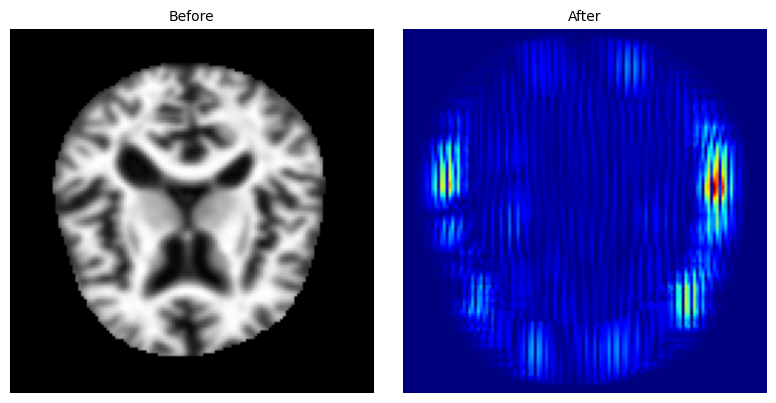

(40 filters × 4 desc = 160)


In [51]:
k0, _t0, l0 = gabor_bank[0]
img_u8_ba = (sample_img * 255).astype(np.uint8)
resp0 = np.abs(cv2.filter2D(img_u8_ba, cv2.CV_64F, k0))
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(sample_img, cmap='gray')
axes[0].set_title('Before', fontsize=10); axes[0].axis('off')
axes[1].imshow(resp0, cmap='jet')
axes[1].set_title('After', fontsize=10); axes[1].axis('off')
plt.tight_layout(); plt.show()
print(f'(40 filters × 4 desc = 160)')

## **5.2 Local Binary Pattern (LBP)**

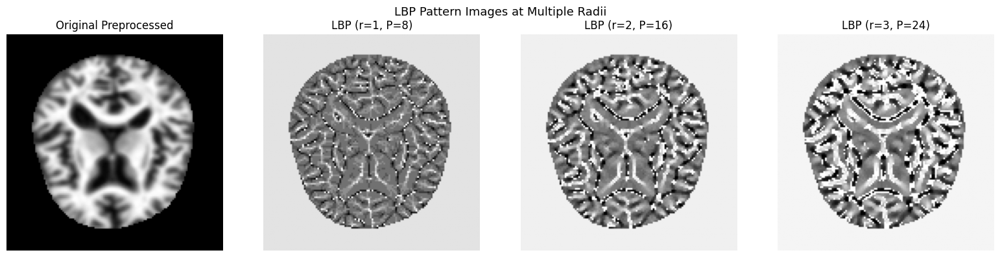

In [52]:
# Visualize LBP pattern images at three radius on the sample image
sample_img_uint8 = (sample_img * 255).astype(np.uint8)
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
fig.suptitle('LBP Pattern Images at Multiple Radii', fontsize=13)

axes[0].imshow(sample_img, cmap='gray')
axes[0].set_title('Original Preprocessed')
axes[0].axis('off')

for col, r in enumerate([1, 2, 3], start=1):
    n_pts = 8 * r
    lbp_map = local_binary_pattern(sample_img_uint8, n_pts, r, method='uniform')
    axes[col].imshow(lbp_map, cmap='gray')
    axes[col].set_title(f'LBP (r={r}, P={n_pts})')
    axes[col].axis('off')

plt.tight_layout()
plt.show()

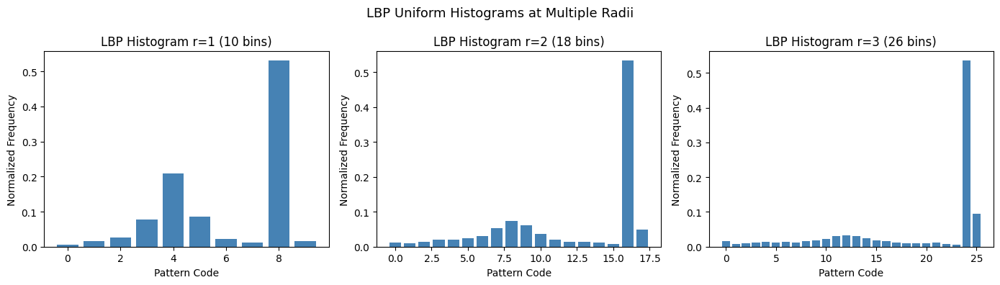

In [53]:
# Visualize LBP histograms at each radius
fig, axes = plt.subplots(1, 3, figsize=(14, 4))
fig.suptitle('LBP Uniform Histograms at Multiple Radii', fontsize=13)
for col, r in enumerate([1, 2, 3]):
    n_pts = 8 * r
    lbp_map = local_binary_pattern(sample_img_uint8, n_pts, r, method='uniform')
    n_bins = int(lbp_map.max()) + 1
    hist, _ = np.histogram(lbp_map, bins=n_bins, range=(0, n_bins), density=True)
    axes[col].bar(range(len(hist)), hist, color='steelblue', edgecolor='none')
    axes[col].set_title(f'LBP Histogram r={r} ({n_bins} bins)')
    axes[col].set_xlabel('Pattern Code')
    axes[col].set_ylabel('Normalized Frequency')

plt.tight_layout()
plt.show()

In [54]:
# Multi-scale LBP (r=1-5) for cortical texture representation
def extract_lbp_features(image, radii=[1, 2, 3, 4, 5]):
    img_uint8 = (image * 255).astype(np.uint8) if image.max() <= 1.0 else image.astype(np.uint8)
    features = []
    for r in radii:
        n_pts = 8 * r
        lbp_map = local_binary_pattern(img_uint8, n_pts, r, method='uniform')
        n_bins = int(lbp_map.max()) + 1
        hist, _ = np.histogram(lbp_map, bins=n_bins, range=(0, n_bins), density=True)
        features.extend(hist)
    return np.array(features, dtype=np.float32)

In [55]:
# Test enhanced LBP feature extraction
lbp_feat_sample = extract_lbp_features(sample_img)
print('LBP feature vector shape:', lbp_feat_sample.shape)
print('First 10 values:', lbp_feat_sample[:10].round(4))


LBP feature vector shape: (130,)
First 10 values: [0.0057 0.0162 0.0261 0.0773 0.2098 0.0857 0.0215 0.0111 0.5306 0.0159]


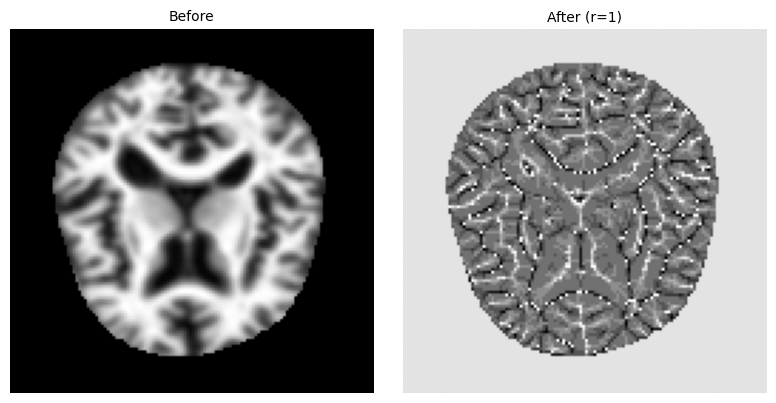

In [56]:
from skimage.feature import local_binary_pattern as _lbp2
img_u8_lbp = (sample_img * 255).astype(np.uint8)
lbp_r1 = _lbp2(img_u8_lbp, 8, 1, method='uniform')
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(sample_img, cmap='gray')
axes[0].set_title('Before', fontsize=10); axes[0].axis('off')
axes[1].imshow(lbp_r1, cmap='gray')
axes[1].set_title('After (r=1)', fontsize=10); axes[1].axis('off')
plt.tight_layout(); plt.show()

## **5.3 Gray-Level Co-occurrence Matrix (GLCM)**

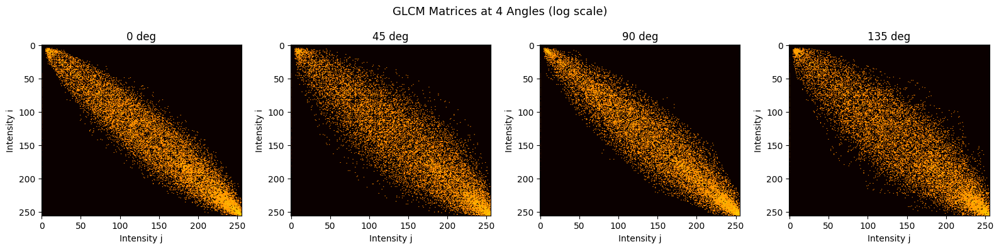

In [57]:
# Visualize GLCM matrices at 4 angles (log scale for visibility)
sample_img_uint8 = (sample_img * 255).astype(np.uint8)
angles = [0, np.pi / 4, np.pi / 2, 3 * np.pi / 4]
angle_labels = ['0 deg', '45 deg', '90 deg', '135 deg']

glcm_vis = graycomatrix(
    sample_img_uint8,
    distances=[1],
    angles=angles,
    levels=256,
    symmetric=True,
    normed=True
)

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
fig.suptitle('GLCM Matrices at 4 Angles (log scale)', fontsize=13)

for i, label in enumerate(angle_labels):
    mat = glcm_vis[:, :, 0, i]
    axes[i].imshow(np.log(mat + 1e-10), cmap='hot', aspect='auto')
    axes[i].set_title(label)
    axes[i].set_xlabel('Intensity j')
    axes[i].set_ylabel('Intensity i')

plt.tight_layout()
plt.show()

In [58]:
# Print Haralick feature values per angle for sample image
properties = ['contrast', 'correlation', 'energy', 'homogeneity']
print('Haralick features from GLCM (sample image):')
print(f'{"Property":<15}' + ''.join(f'{a:>12}' for a in angle_labels))

for prop in properties:
    vals = graycoprops(glcm_vis, prop).flatten()
    print(f'{prop:<15}' + ''.join(f'{v:>12.4f}' for v in vals))

Haralick features from GLCM (sample image):
Property              0 deg      45 deg      90 deg     135 deg
contrast           328.8077    621.1340    361.3772    618.4631
correlation          0.9790      0.9604      0.9769      0.9605
energy               0.5126      0.5062      0.5130      0.5062
homogeneity          0.5473      0.5311      0.5487      0.5318


In [59]:
# Enhanced GLCM feature extraction using 6 Haralick properties
# (including dissimilarity and ASM) across 4 orientations (24 features)

def extract_glcm_features(image):
    img_uint8 = (image * 255).astype(np.uint8) if image.max() <= 1.0 else image.astype(np.uint8)
    angles = [0, np.pi / 4, np.pi / 2, 3 * np.pi / 4]
    glcm = graycomatrix(
        img_uint8, distances=[1], angles=angles,
        levels=256, symmetric=True, normed=True
    )
    features = []
    for prop in ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation', 'ASM']:
        vals = graycoprops(glcm, prop).flatten()
        features.extend(vals)
    return np.array(features, dtype=np.float32)

In [60]:
# Test enhanced GLCM feature extraction

glcm_feat_sample = extract_glcm_features(sample_img)
print('GLCM feature vector shape:', glcm_feat_sample.shape)
print('Expected: (24,) 6 properties x 4 angles')
print('Values:', glcm_feat_sample.round(4))


GLCM feature vector shape: (24,)
Expected: (24,) 6 properties x 4 angles
Values: [3.288077e+02 6.211340e+02 3.613772e+02 6.184632e+02 8.973700e+00
 1.277900e+01 9.244800e+00 1.275160e+01 5.473000e-01 5.311000e-01
 5.487000e-01 5.318000e-01 5.126000e-01 5.062000e-01 5.130000e-01
 5.062000e-01 9.790000e-01 9.604000e-01 9.769000e-01 9.605000e-01
 2.627000e-01 2.562000e-01 2.632000e-01 2.562000e-01]


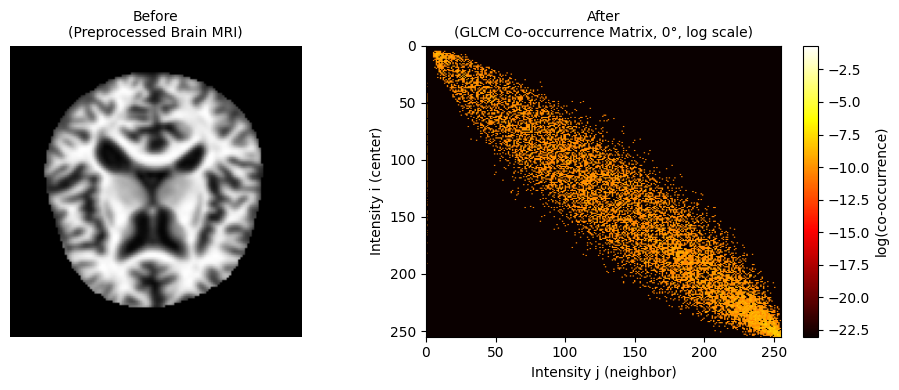

(4 angles × 4 properties = 16)
Haralick values (angle 0°): contrast=328.8077 correlation=8.9737 energy=0.5473 homogeneity=0.5126


In [61]:
img_u8_g  = (sample_img * 255).astype(np.uint8)
glcm_ba0  = graycomatrix(img_u8_g, distances=[1], angles=[0],
                          levels=256, symmetric=True, normed=True)
mat0      = glcm_ba0[:, :, 0, 0]          # 256×256 GLCM matrix at 0°
log_mat0  = np.log(mat0 + 1e-10)          # log scale agar lebih terlihat

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

axes[0].imshow(sample_img, cmap='gray')
axes[0].set_title('Before\n(Preprocessed Brain MRI)', fontsize=10)
axes[0].axis('off')

im = axes[1].imshow(log_mat0, cmap='hot', aspect='auto',
                    extent=[0, 255, 255, 0])
axes[1].set_title('After\n(GLCM Co-occurrence Matrix, 0°, log scale)', fontsize=10)
axes[1].set_xlabel('Intensity j (neighbor)')
axes[1].set_ylabel('Intensity i (center)')
plt.colorbar(im, ax=axes[1], label='log(co-occurrence)')

plt.tight_layout()
plt.show()

print(f'(4 angles × 4 properties = 16)')
print('Haralick values (angle 0°): contrast={:.4f} correlation={:.4f} energy={:.4f} homogeneity={:.4f}'.format(
    *glcm_feat_sample[[0,4,8,12]]))

## **5.4 Feature Vector Construction**

In [62]:
# Define fusion feature extraction function
def extract_fusion_features(image):
    f_gabor = extract_gabor_features(image)
    f_lbp = extract_lbp_features(image)
    f_glcm = extract_glcm_features(image)
    return np.concatenate([f_gabor, f_lbp, f_glcm])

Feature dimensions per method:
Gabor: 336 (84 filters x 4 desc)
LBP: 130 (5 radii, variable bins)
GLCM: 24 (6 properties x 4 angles)
Total: 490


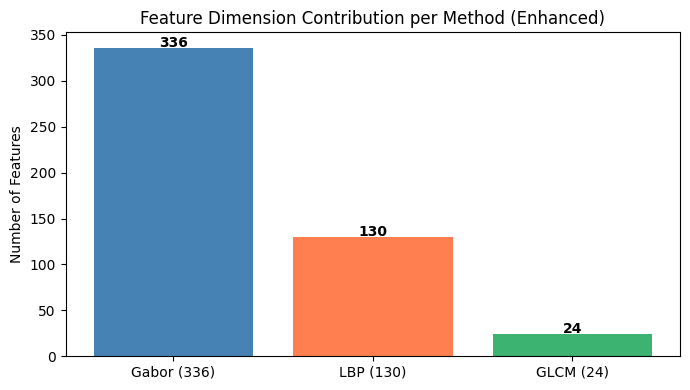

In [63]:
# Inspect updated feature dimensions
f_gabor_s = extract_gabor_features(sample_img)
f_lbp_s = extract_lbp_features(sample_img)
f_glcm_s = extract_glcm_features(sample_img)
f_total = np.concatenate([f_gabor_s, f_lbp_s, f_glcm_s])

print('Feature dimensions per method:')
print(f'Gabor: {f_gabor_s.shape[0]} (84 filters x 4 desc)')
print(f'LBP: {f_lbp_s.shape[0]} (5 radii, variable bins)')
print(f'GLCM: {f_glcm_s.shape[0]} (6 properties x 4 angles)')
print(f'Total: {f_total.shape[0]}')

fig, ax = plt.subplots(figsize=(7, 4))
labels = [f'Gabor ({f_gabor_s.shape[0]})', f'LBP ({f_lbp_s.shape[0]})', f'GLCM ({f_glcm_s.shape[0]})']
sizes = [f_gabor_s.shape[0], f_lbp_s.shape[0], f_glcm_s.shape[0]]
bars = ax.bar(labels, sizes, color=['steelblue', 'coral', 'mediumseagreen'])
for bar, val in zip(bars, sizes):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
            str(val), ha='center', fontweight='bold')
ax.set_title('Feature Dimension Contribution per Method (Enhanced)')
ax.set_ylabel('Number of Features')
plt.tight_layout()
plt.show()


In [64]:
# Extract fusion features for train, validation, and test splits
from tqdm.auto import tqdm
def build_feature_matrix(df_split, desc='Extracting'):
    X, y = [], []
    for _, row in tqdm(df_split.iterrows(), total=len(df_split), desc=desc):
        img = preprocess_image(row['filepath'])
        feat = extract_fusion_features(img)
        X.append(feat)
        y.append(row['label'])
    return np.array(X, dtype=np.float32), np.array(y, dtype=np.int32)

print('Extracting fusion features for all splits...')
X_train_raw, y_train = build_feature_matrix(train_df, desc='Train')
X_val_raw, y_val = build_feature_matrix(val_df, desc='Validation')
X_test_raw,  y_test = build_feature_matrix(test_df, desc='Test')

print('Train matrix:', X_train_raw.shape)
print('Val matrix:', X_val_raw.shape)
print('Test matrix:', X_test_raw.shape)

joblib.dump((X_train_raw, y_train), 'results/X_train_raw.pkl')
joblib.dump((X_val_raw, y_val), 'results/X_val_raw.pkl')
joblib.dump((X_test_raw,  y_test), 'results/X_test_raw.pkl')
print("Features saved")

c:\Users\Rizqi Aqilah\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Extracting fusion features for all splits...


Test: 100%|██████████| 6600/6600 [15:56<00:00,  6.90it/s]

Train matrix: (30800, 490)
Val matrix: (6600, 490)
Test matrix: (6600, 490)
Features saved


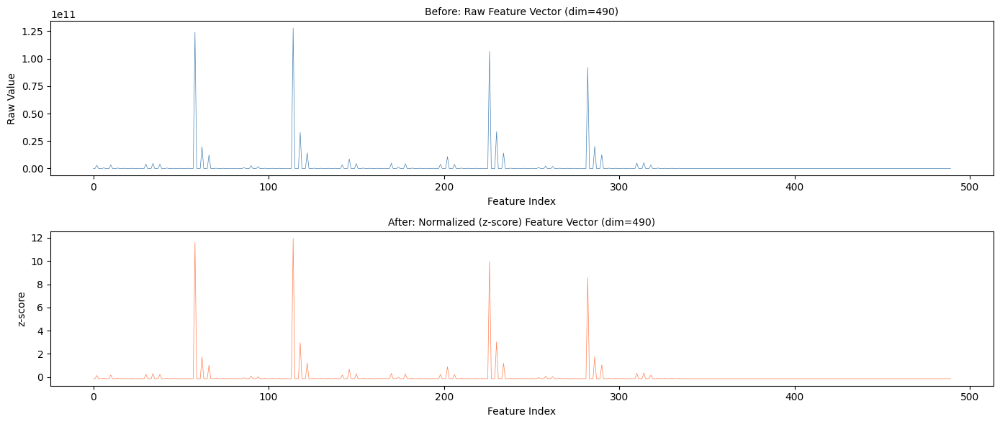

In [65]:
f_raw_s54 = np.concatenate([gabor_feat_sample, lbp_feat_sample, glcm_feat_sample])
f_norm_s54 = (f_raw_s54 - f_raw_s54.mean()) / (f_raw_s54.std() + 1e-10)
fig, axes = plt.subplots(2, 1, figsize=(14, 6))
axes[0].plot(f_raw_s54, color='steelblue', linewidth=0.5)
axes[0].set_title(f'Before: Raw Feature Vector (dim={len(f_raw_s54)})', fontsize=10)
axes[0].set_xlabel('Feature Index'); axes[0].set_ylabel('Raw Value')
axes[1].plot(f_norm_s54, color='coral', linewidth=0.5)
axes[1].set_title(f'After: Normalized (z-score) Feature Vector (dim={len(f_norm_s54)})', fontsize=10)
axes[1].set_xlabel('Feature Index'); axes[1].set_ylabel('z-score')
plt.tight_layout(); plt.show()

In [66]:
# Standardize features using training-set statistics
scaler_fusion = StandardScaler()
X_train_fusion = scaler_fusion.fit_transform(X_train_raw)
X_val_fusion = scaler_fusion.transform(X_val_raw)
X_test_fusion = scaler_fusion.transform(X_test_raw)

print('Normalized train matrix:', X_train_fusion.shape)
print('Mean of first 5 features (should be ~0):', X_train_fusion.mean(axis=0)[:5].round(4))
print('Std  of first 5 features (should be ~1):', X_train_fusion.std(axis=0)[:5].round(4))

Normalized train matrix: (30800, 490)
Mean of first 5 features (should be ~0): [-0. -0.  0. -0.  0.]
Std  of first 5 features (should be ~1): [1. 1. 1. 1. 1.]


## **5.5 Haar Wavelet FE**

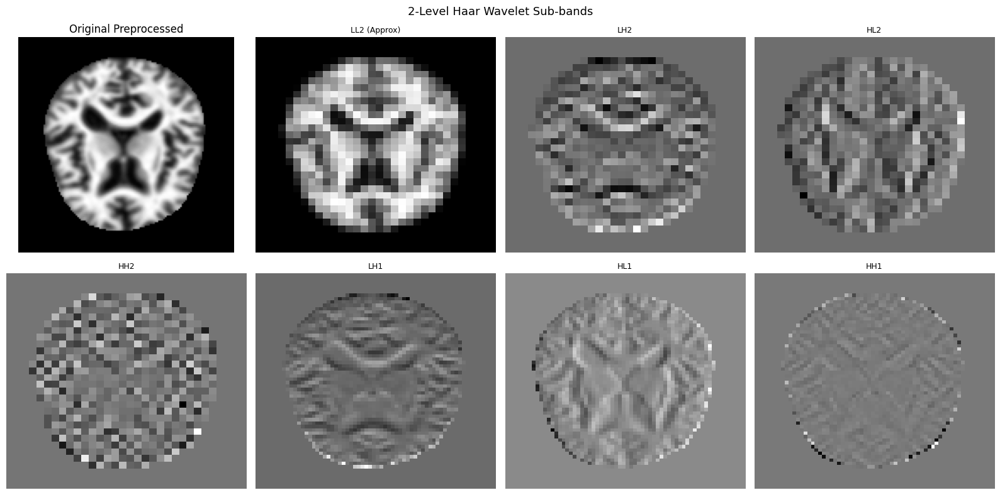

In [67]:
# Two-level Haar wavelet decomposition visualization.
# Level 1 produces: LL1, LH1, HL1, HH1
# Level 2 decomposes LL1 further into: LL2, LH2, HL2, HH2

img_float64 = sample_img.astype(np.float64) * 255.0
coeffs = pywt.wavedec2(img_float64, wavelet='haar', level=2)

sub_labels = ['LL2 (Approx)', 'LH2', 'HL2', 'HH2', 'LH1', 'HL1', 'HH1']
all_bands = [coeffs[0]] + [c for tup in coeffs[1:] for c in tup]

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
fig.suptitle('2-Level Haar Wavelet Sub-bands', fontsize=13)

axes[0, 0].imshow(sample_img, cmap='gray')
axes[0, 0].set_title('Original Preprocessed')
axes[0, 0].axis('off')

for i, (label, band) in enumerate(zip(sub_labels, all_bands)):
    ax = axes[(i + 1) // 4, (i + 1) % 4]
    ax.imshow(band, cmap='gray', aspect='auto')
    ax.set_title(label, fontsize=9)
    ax.axis('off')

plt.tight_layout()
plt.show()

In [68]:
# Define Haar Wavelet feature extraction function
def extract_wavelet_features(image, wavelet='haar', level=2):
    img_float64 = image.astype(np.float64) * 255.0 if image.max() <= 1.0 else image.astype(np.float64)
    coeffs = pywt.wavedec2(img_float64, wavelet=wavelet, level=level)

    all_bands = [coeffs[0]] + [c for tup in coeffs[1:] for c in tup]
    features = []

    for band in all_bands:
        flat = band.ravel()
        mean = np.mean(flat)
        std = np.std(flat)
        energy = np.sum(flat ** 2)
        prob = (np.abs(flat) + 1e-10) / (np.sum(np.abs(flat)) + 1e-10)
        entropy = -np.sum(prob * np.log(prob + 1e-10))
        features.extend([mean, std, energy, entropy])

    return np.array(features, dtype=np.float32)

In [69]:
# Test Haar Wavelet feature extraction on sample image
wav_feat_sample = extract_wavelet_features(sample_img)
print('Wavelet feature vector shape:', wav_feat_sample.shape)
print('Expected: (28,) 7 sub-bands x 4 descriptors')
print('Values:', wav_feat_sample.round(2))

Wavelet feature vector shape: (28,)
Expected: (28,) 7 sub-bands x 4 descriptors
Values: [ 2.8585999e+02  3.3906000e+02  2.0140099e+08  6.1300001e+00
  3.4999999e-01  5.9189999e+01  3.5881112e+06  5.9099998e+00
  5.0000000e-01  5.6689999e+01  3.2916682e+06  5.9499998e+00
 -9.0000004e-02  2.0410000e+01  4.2647856e+05  5.9400001e+00
  9.0000004e-02  1.8290001e+01  1.3696924e+06  7.1900001e+00
 -7.9999998e-02  1.6920000e+01  1.1724732e+06  7.2399998e+00
 -2.9999999e-02  6.1300001e+00  1.5382625e+05  6.9400001e+00]


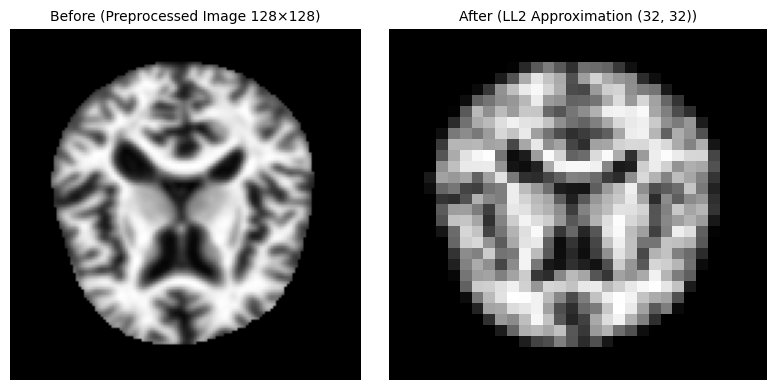

Wavelet feature vector: (28,)  (7 sub-bands × 4 desc = 28)


In [70]:
coeffs_s55 = pywt.wavedec2(sample_img.astype(np.float64)*255.0, wavelet='haar', level=2)
ll2_s55 = coeffs_s55[0]
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(sample_img, cmap='gray')
axes[0].set_title('Before (Preprocessed Image 128×128)', fontsize=10); axes[0].axis('off')
axes[1].imshow(ll2_s55, cmap='gray', aspect='auto')
axes[1].set_title(f'After (LL2 Approximation {ll2_s55.shape})', fontsize=10); axes[1].axis('off')
plt.tight_layout(); plt.show()
print(f'Wavelet feature vector: {wav_feat_sample.shape}  (7 sub-bands × 4 desc = 28)')

In [71]:
# Extract Haar Wavelet features for all splits
def build_wavelet_matrix(df_split, desc='Wavelet'):
    X, y = [], []
    for _, row in tqdm(df_split.iterrows(), total=len(df_split), desc=desc):
        img = preprocess_image(row['filepath'])
        feat = extract_wavelet_features(img)
        X.append(feat)
        y.append(row['label'])
    return np.array(X, dtype=np.float32), np.array(y, dtype=np.int32)

print('Extracting Haar Wavelet features for all splits...')
X_train_wav_raw, _ = build_wavelet_matrix(train_df, desc='Train Wavelet')
X_val_wav_raw,   _ = build_wavelet_matrix(val_df, desc='Val Wavelet')
X_test_wav_raw,  _ = build_wavelet_matrix(test_df,  desc='Test Wavelet')

scaler_wav = StandardScaler()
X_train_wav = scaler_wav.fit_transform(X_train_wav_raw)
X_val_wav = scaler_wav.transform(X_val_wav_raw)
X_test_wav = scaler_wav.transform(X_test_wav_raw)

print('Wavelet train matrix:', X_train_wav.shape)
print('Wavelet val matrix:', X_val_wav.shape)
print('Wavelet test matrix:', X_test_wav.shape)

Extracting Haar Wavelet features for all splits...


Test Wavelet: 100%|██████████| 6600/6600 [02:59<00:00, 36.79it/s]

Wavelet train matrix: (30800, 28)
Wavelet val matrix: (6600, 28)
Wavelet test matrix: (6600, 28)


## **5.6 Comparison of Fusion FE vs. Haar Wavelet FE**

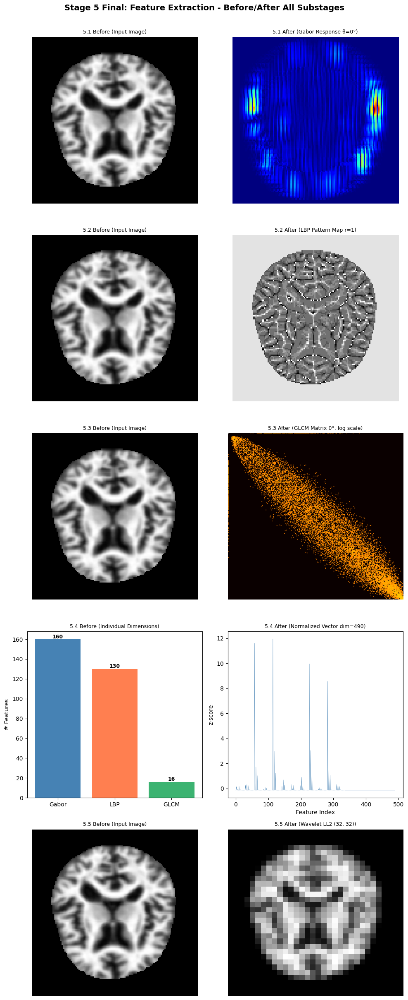

In [72]:
from skimage.feature import local_binary_pattern as _lbp5
img_u8_5f = (sample_img * 255).astype(np.uint8)

k5f,_,_ = gabor_bank[0]
resp5f = np.abs(cv2.filter2D(img_u8_5f, cv2.CV_64F, k5f))
lbp5f = _lbp5(img_u8_5f, 8, 1, method='uniform')
glcm5f = graycomatrix(img_u8_5f, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
mat5f = glcm5f[:,:,0,0]
f_r5f = np.concatenate([gabor_feat_sample, lbp_feat_sample, glcm_feat_sample])
f_n5f = (f_r5f - f_r5f.mean())/(f_r5f.std()+1e-10)
c5f = pywt.wavedec2(img_u8_5f.astype(np.float64), wavelet='haar', level=2)
ll2_5f = c5f[0]

fig, axes = plt.subplots(5, 2, figsize=(10, 24))
fig.suptitle('Stage 5 Final: Feature Extraction - Before/After All Substages',
             fontsize=14, fontweight='bold', y=1.005)

axes[0,0].imshow(sample_img, cmap='gray')
axes[0,0].set_title('5.1 Before (Input Image)', fontsize=9); axes[0,0].axis('off')
axes[0,1].imshow(resp5f, cmap='jet')
axes[0,1].set_title('5.1 After (Gabor Response θ=0°)', fontsize=9); axes[0,1].axis('off')

axes[1,0].imshow(sample_img, cmap='gray')
axes[1,0].set_title('5.2 Before (Input Image)', fontsize=9); axes[1,0].axis('off')
axes[1,1].imshow(lbp5f, cmap='gray')
axes[1,1].set_title('5.2 After (LBP Pattern Map r=1)', fontsize=9); axes[1,1].axis('off')

axes[2,0].imshow(sample_img, cmap='gray')
axes[2,0].set_title('5.3 Before (Input Image)', fontsize=9); axes[2,0].axis('off')
axes[2,1].imshow(np.log(mat5f+1e-10), cmap='hot', aspect='auto')
axes[2,1].set_title('5.3 After (GLCM Matrix 0°, log scale)', fontsize=9); axes[2,1].axis('off')

dims5f = [160, len(lbp_feat_sample), 16]
axes[3,0].bar(['Gabor','LBP','GLCM'], dims5f, color=['steelblue','coral','mediumseagreen'])
for jj,vv in enumerate(dims5f): axes[3,0].text(jj,vv+1,str(vv),ha='center',fontweight='bold',fontsize=9)
axes[3,0].set_title('5.4 Before (Individual Dimensions)', fontsize=9); axes[3,0].set_ylabel('# Features')
axes[3,1].plot(f_n5f, color='steelblue', linewidth=0.4)
axes[3,1].set_title(f'5.4 After (Normalized Vector dim={len(f_n5f)})', fontsize=9)
axes[3,1].set_xlabel('Feature Index'); axes[3,1].set_ylabel('z-score')

axes[4,0].imshow(sample_img, cmap='gray')
axes[4,0].set_title('5.5 Before (Input Image)', fontsize=9); axes[4,0].axis('off')
axes[4,1].imshow(ll2_5f, cmap='gray', aspect='auto')
axes[4,1].set_title(f'5.5 After (Wavelet LL2 {ll2_5f.shape})', fontsize=9); axes[4,1].axis('off')

plt.tight_layout(); plt.show()

In [73]:
# Quick SVM baseline on a subset to compare feature spaces
SUBSET = min(2000, len(X_train_fusion))

svm_q1 = SVC(kernel='rbf', C=1.0, gamma='scale', probability=False, random_state=42)
svm_q1.fit(X_train_fusion[:SUBSET], y_train[:SUBSET])
acc_fusion = accuracy_score(y_val, svm_q1.predict(X_val_fusion))

svm_q2 = SVC(kernel='rbf', C=1.0, gamma='scale', probability=False, random_state=42)
svm_q2.fit(X_train_wav[:SUBSET], y_train[:SUBSET])
acc_wav = accuracy_score(y_val, svm_q2.predict(X_val_wav))

print('Quick SVM Baseline Comparison (subset of', SUBSET, 'samples):')
print(f'Fusion FE (dim={X_train_fusion.shape[1]}) -> Val accuracy: {acc_fusion:.4f}')
print(f'Wavelet FE (dim={X_train_wav.shape[1]}) -> Val accuracy: {acc_wav:.4f}')

Quick SVM Baseline Comparison (subset of 2000 samples):
Fusion FE (dim=490) -> Val accuracy: 0.5876
Wavelet FE (dim=28) -> Val accuracy: 0.4176


                    Method  Dimension  Val Acc
Fusion FE (Gabor+LBP+GLCM)        490 0.587576
           Haar Wavelet FE         28 0.417576


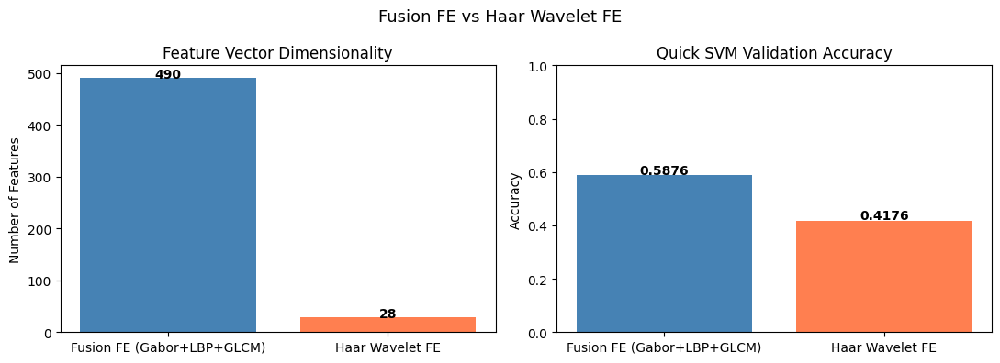

In [74]:
# Visualize feature space comparison
df_cmp = pd.DataFrame({
    'Method': ['Fusion FE (Gabor+LBP+GLCM)', 'Haar Wavelet FE'],
    'Dimension': [X_train_fusion.shape[1], X_train_wav.shape[1]],
    'Val Acc': [acc_fusion, acc_wav],
})
print(df_cmp.to_string(index=False))

fig, axes = plt.subplots(1, 2, figsize=(11, 4))
fig.suptitle('Fusion FE vs Haar Wavelet FE', fontsize=13)

axes[0].bar(df_cmp['Method'], df_cmp['Dimension'],
            color=['steelblue', 'coral'])
axes[0].set_title('Feature Vector Dimensionality')
axes[0].set_ylabel('Number of Features')
for i, v in enumerate(df_cmp['Dimension']):
    axes[0].text(i, v + 0.5, str(v), ha='center', fontweight='bold')

axes[1].bar(df_cmp['Method'], df_cmp['Val Acc'],
            color=['steelblue', 'coral'])
axes[1].set_title('Quick SVM Validation Accuracy')
axes[1].set_ylabel('Accuracy')
axes[1].set_ylim(0, 1)
for i, v in enumerate(df_cmp['Val Acc']):
    axes[1].text(i, v + 0.005, f'{v:.4f}', ha='center', fontweight='bold')

plt.tight_layout()
plt.show()

# **Stage 6: Classification**

The normalized feature vector is independently fed into 2 classifiers.
| Model | Role | Configuration |
|-------|------|---------------|
| SVM with RBF Kernel | Primary classifier | Hyperparameters C and γ tuned via GridSearchCV |
| Random Forest | Comparator classifier | n_estimators and max_depth tuned via GridSearchCV |
- SVM (RBF Kernel) as the primary model because it is effective in high-dimensional and non-linear feature spaces.
- Random Forest as the comparator model because it enables feature importance analysis in the interpretability stage.

## **6.1 SVM with RBF Kernel**

In [75]:
# Define SVM with RBF kernel
svm_model = SVC(
    kernel='rbf',
    C=1.0,
    gamma='scale',
    probability=True,
    class_weight='balanced',
    random_state=42
)

print('SVM (RBF) model:')
print(svm_model)

SVM (RBF) model:
SVC(class_weight='balanced', probability=True, random_state=42)


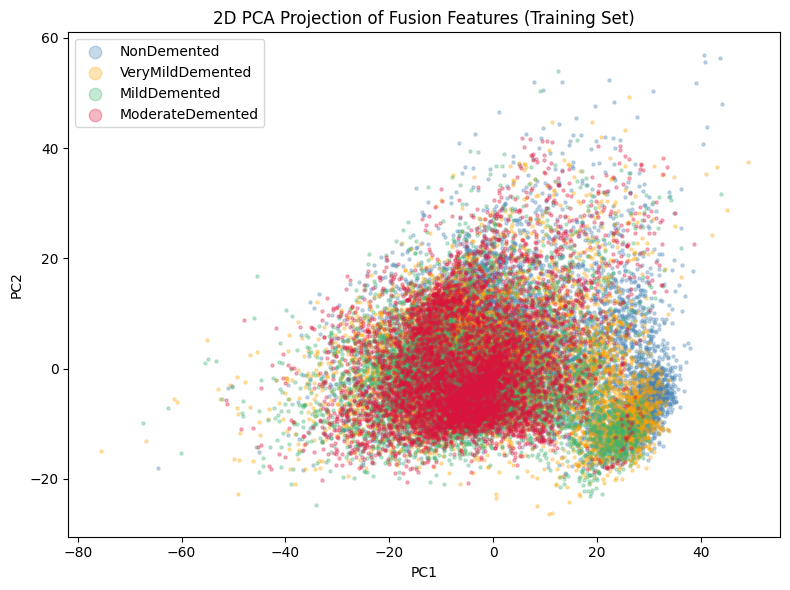

In [76]:
# Visualize 2D PCA projection to confirm non-linear class structure
from sklearn.decomposition import PCA
pca_vis = PCA(n_components=2, random_state=42)
X_train_2d = pca_vis.fit_transform(X_train_fusion)

class_labels = ['NonDemented', 'VeryMildDemented', 'MildDemented', 'ModerateDemented']
colors = ['steelblue', 'orange', 'mediumseagreen', 'crimson']

plt.figure(figsize=(8, 6))
for label_id, (cls, color) in enumerate(zip(class_labels, colors)):
    mask = y_train == label_id
    plt.scatter(X_train_2d[mask, 0], X_train_2d[mask, 1],
                alpha=0.3, s=5, label=cls, color=color)

plt.title('2D PCA Projection of Fusion Features (Training Set)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend(markerscale=4, loc='best')
plt.tight_layout()
plt.show()

## **6.2 Random Forest**

In [77]:
# Define Random Forest model
rf_model = RandomForestClassifier(
    n_estimators=100,
    max_depth=None,
    class_weight='balanced',
    random_state=42,
    n_jobs=-1
)

print('Random Forest model:')
print(rf_model)

Random Forest model:
RandomForestClassifier(class_weight='balanced', n_jobs=-1, random_state=42)


Training SVM & RF on 3000 samples...

Validation Accuracy (subset 3000 samples):
SVM (RBF): 0.6168
Random Forest: 0.5615

SVM Classification Report (Validation):
                  precision    recall  f1-score   support

     NonDemented       0.65      0.59      0.62      1920
VeryMildDemented       0.49      0.37      0.42      1680
    MildDemented       0.51      0.62      0.56      1500
ModerateDemented       0.79      0.91      0.85      1500

        accuracy                           0.62      6600
       macro avg       0.61      0.63      0.61      6600
    weighted avg       0.61      0.62      0.61      6600


Random Forest Classification Report (Validation)
                  precision    recall  f1-score   support

     NonDemented       0.57      0.63      0.60      1920
VeryMildDemented       0.42      0.37      0.40      1680
    MildDemented       0.52      0.48      0.50      1500
ModerateDemented       0.71      0.77      0.74      1500

        accuracy             

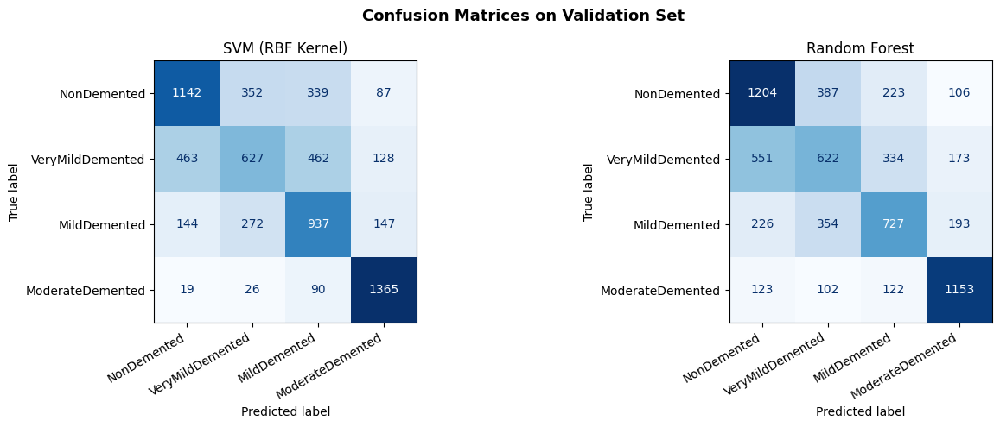

C:\Users\Rizqi Aqilah\AppData\Local\Temp\ipykernel_35152\1576139645.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(class_names_s6, rotation=20, ha='right')
C:\Users\Rizqi Aqilah\AppData\Local\Temp\ipykernel_35152\1576139645.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(class_names_s6, rotation=20, ha='right')


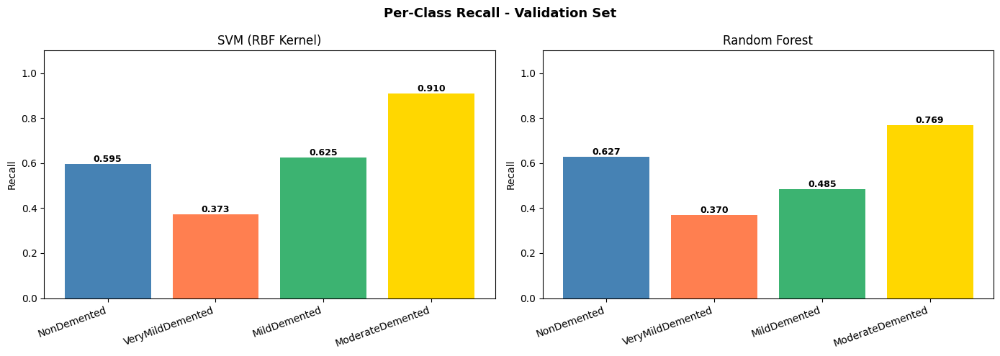


Sample Predictions (first 10 validation samples):
Idx   True                   SVM Pred               RF Pred               
0     VeryMildDemented       NonDemented✗           NonDemented✗          
1     NonDemented            NonDemented✓           NonDemented✓          
2     ModerateDemented       ModerateDemented✓      VeryMildDemented✗     
3     VeryMildDemented       VeryMildDemented✓      VeryMildDemented✓     
4     ModerateDemented       ModerateDemented✓      NonDemented✗          
5     VeryMildDemented       VeryMildDemented✓      VeryMildDemented✓     
6     MildDemented           ModerateDemented✗      ModerateDemented✗     
7     VeryMildDemented       VeryMildDemented✓      VeryMildDemented✓     
8     NonDemented            NonDemented✓           NonDemented✓          
9     MildDemented           MildDemented✓          MildDemented✓         


In [78]:
# Classification result
from sklearn.metrics import (classification_report, confusion_matrix,ConfusionMatrixDisplay, accuracy_score)

class_names_s6 = ['NonDemented','VeryMildDemented','MildDemented','ModerateDemented']
SUBSET = min(3000, len(X_train_fusion))

print(f"Training SVM & RF on {SUBSET} samples...")
svm_p = SVC(kernel='rbf', C=1.0, gamma='scale', probability=True,
            class_weight='balanced', random_state=42)
svm_p.fit(X_train_fusion[:SUBSET], y_train[:SUBSET])

rf_p = RandomForestClassifier(n_estimators=100, class_weight='balanced',
                               random_state=42, n_jobs=-1)
rf_p.fit(X_train_fusion[:SUBSET], y_train[:SUBSET])

y_pred_svm_p = svm_p.predict(X_val_fusion)
y_pred_rf_p  = rf_p.predict(X_val_fusion)
acc_svm_p = accuracy_score(y_val, y_pred_svm_p)
acc_rf_p  = accuracy_score(y_val, y_pred_rf_p)

print(f"\nValidation Accuracy (subset {SUBSET} samples):")
print(f"SVM (RBF): {acc_svm_p:.4f}")
print(f"Random Forest: {acc_rf_p:.4f}")

print("\nSVM Classification Report (Validation):")
print(classification_report(y_val, y_pred_svm_p, target_names=class_names_s6))
print("\nRandom Forest Classification Report (Validation)")
print(classification_report(y_val, y_pred_rf_p,  target_names=class_names_s6))

# Confusion matrices
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Confusion Matrices on Validation Set', fontsize=13, fontweight='bold')
for ax, yp, title in zip(axes, [y_pred_svm_p, y_pred_rf_p],
                          ['SVM (RBF Kernel)', 'Random Forest']):
    cm = confusion_matrix(y_val, yp)
    ConfusionMatrixDisplay(cm, display_labels=class_names_s6).plot(ax=ax, cmap='Blues', colorbar=False)
    ax.set_title(title); ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')
plt.tight_layout(); plt.show()

# Per-class recall bar chart
fig2, axes2 = plt.subplots(1, 2, figsize=(14, 5))
fig2.suptitle('Per-Class Recall - Validation Set', fontsize=13, fontweight='bold')
for ax2, yp, title2 in zip(axes2, [y_pred_svm_p, y_pred_rf_p],
                             ['SVM (RBF Kernel)', 'Random Forest']):
    cm2 = confusion_matrix(y_val, yp)
    pc_rec = cm2.diagonal() / cm2.sum(axis=1)
    bars2  = ax2.bar(class_names_s6, pc_rec, color=['steelblue','coral','mediumseagreen','gold'])
    ax2.set_ylim(0, 1.1); ax2.set_ylabel('Recall'); ax2.set_title(title2)
    ax2.set_xticklabels(class_names_s6, rotation=20, ha='right')
    for b2,v2 in zip(bars2,pc_rec):
        ax2.text(b2.get_x()+b2.get_width()/2, v2+0.01, f'{v2:.3f}',
                 ha='center', fontsize=9, fontweight='bold')
plt.tight_layout(); plt.show()

# Sample predictions table
print("\nSample Predictions (first 10 validation samples):")
print(f"{'Idx':<5} {'True':<22} {'SVM Pred':<22} {'RF Pred':<22}")
for i in range(10):
    t  = class_names_s6[y_val[i]]
    ps = class_names_s6[y_pred_svm_p[i]]
    pr = class_names_s6[y_pred_rf_p[i]]
    ms = '✓' if y_val[i]==y_pred_svm_p[i] else '✗'
    mr = '✓' if y_val[i]==y_pred_rf_p[i]  else '✗'
    print(f"{i:<5} {t:<22} {ps+ms:<22} {pr+mr:<22}")

In [79]:
# Fit both models on training set to demonstrate classification output
print('Training SVM (default params) on full training set...')
svm_model.fit(X_train_fusion, y_train)

print('Training Random Forest (default params) on full training set...')
rf_model.fit(X_train_fusion, y_train)

Training SVM (default params) on full training set...
Training Random Forest (default params) on full training set...


,n_estimators,100
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [80]:
# Classification report for SVM (default params) on validation set
y_val_pred_svm = svm_model.predict(X_val_fusion)

print('SVM (Default Params) - Validation Classification Report:')
print(classification_report(
    y_val, y_val_pred_svm,
    target_names=['NonDemented', 'VeryMildDemented', 'MildDemented', 'ModerateDemented']
))

SVM (Default Params) - Validation Classification Report:
                  precision    recall  f1-score   support

     NonDemented       0.74      0.67      0.71      1920
VeryMildDemented       0.66      0.59      0.62      1680
    MildDemented       0.67      0.80      0.73      1500
ModerateDemented       0.95      0.98      0.96      1500

        accuracy                           0.75      6600
       macro avg       0.75      0.76      0.76      6600
    weighted avg       0.75      0.75      0.75      6600



In [81]:
# Classification report for Random Forest (default params) on validation set
y_val_pred_rf = rf_model.predict(X_val_fusion)

print('Random Forest (Default Params) - Validation Classification Report:')
print(classification_report(
    y_val, y_val_pred_rf,
    target_names=['NonDemented', 'VeryMildDemented', 'MildDemented', 'ModerateDemented']
))

Random Forest (Default Params) - Validation Classification Report:
                  precision    recall  f1-score   support

     NonDemented       0.67      0.72      0.70      1920
VeryMildDemented       0.63      0.51      0.56      1680
    MildDemented       0.64      0.70      0.67      1500
ModerateDemented       0.88      0.91      0.90      1500

        accuracy                           0.71      6600
       macro avg       0.71      0.71      0.71      6600
    weighted avg       0.70      0.71      0.70      6600



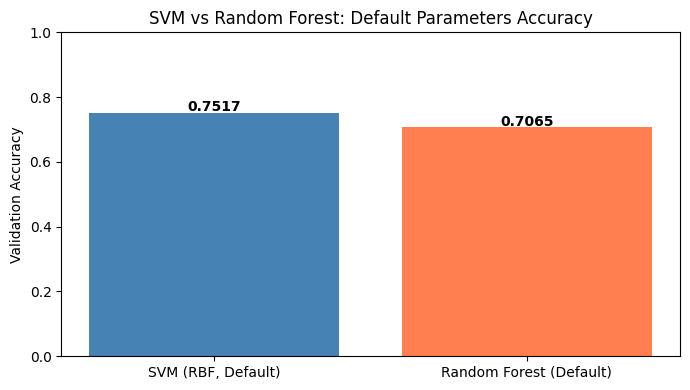

SVM (Default) val accuracy: 0.7517
RF (Default) val accuracy: 0.7065


In [82]:
# Side-by-side accuracy comparison (default params, validation set)
acc_svm_default = accuracy_score(y_val, y_val_pred_svm)
acc_rf_default = accuracy_score(y_val, y_val_pred_rf)

models = ['SVM (RBF, Default)', 'Random Forest (Default)']
accs = [acc_svm_default, acc_rf_default]
colors = ['steelblue', 'coral']

fig, ax = plt.subplots(figsize=(7, 4))
bars = ax.bar(models, accs, color=colors)
for bar, val in zip(bars, accs):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.005,
            f'{val:.4f}', ha='center', fontweight='bold')
ax.set_ylim(0, 1)
ax.set_ylabel('Validation Accuracy')
ax.set_title('SVM vs Random Forest: Default Parameters Accuracy')
plt.tight_layout()
plt.show()

print(f'SVM (Default) val accuracy: {acc_svm_default:.4f}')
print(f'RF (Default) val accuracy: {acc_rf_default:.4f}')

In [83]:
# Show 10 sample predictions vs ground truth from validation set
class_names = ['NonDemented', 'VeryMildDemented', 'MildDemented', 'ModerateDemented']

print('Sample predictions from SVM (default):')
print(f'{"Index":<8} {"True Label":<22} {"Predicted (SVM)":<22} {"Correct?":<10}')
for i in range(10):
    true_lbl = class_names[y_val[i]]
    pred_lbl = class_names[y_val_pred_svm[i]]
    correct = 'Yes' if y_val[i] == y_val_pred_svm[i] else 'No'
    print(f'{i:<8} {true_lbl:<22} {pred_lbl:<22} {correct:<10}')

Sample predictions from SVM (default):
Index    True Label             Predicted (SVM)        Correct?  
0        VeryMildDemented       VeryMildDemented       Yes       
1        NonDemented            NonDemented            Yes       
2        ModerateDemented       ModerateDemented       Yes       
3        VeryMildDemented       VeryMildDemented       Yes       
4        ModerateDemented       ModerateDemented       Yes       
5        VeryMildDemented       VeryMildDemented       Yes       
6        MildDemented           MildDemented           Yes       
7        VeryMildDemented       VeryMildDemented       Yes       
8        NonDemented            VeryMildDemented       No        
9        MildDemented           MildDemented           Yes       


# **Stage 7: Data Training**

The classification results are then being trained.
- Both classifiers are trained under stratified 5-fold cross-validation to ensure each fold contains proportional class representation.
- GridSearchCV is used for systematic hyperparameter optimization across both models, minimizing the risk of suboptimal performance because of default parameter settings.

## **7.1 Stratified 5-Fold Cross-Validation**

In [84]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

In [85]:
# Run 5-fold CV for SVM with default parameters (3000 samples)
CV_SUBSET_N = 3000

X_cv_sub, _, y_cv_sub, _ = train_test_split(
    X_train_fusion, y_train,
    train_size=CV_SUBSET_N,
    stratify=y_train,
    random_state=42
)

print(f'CV subset size: {X_cv_sub.shape[0]} samples')
print(f'Class distribution: {dict(zip(*np.unique(y_cv_sub, return_counts=True)))}')
print()

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

print('Running 5-fold CV for SVM...')
cv_scores_svm = cross_val_score(
    SVC(kernel='rbf', C=1.0, gamma='scale', probability=False,
        class_weight='balanced', random_state=42),
    X_cv_sub, y_cv_sub,
    cv=cv, scoring='accuracy', n_jobs=-1
)

print('SVM CV accuracy per fold:', cv_scores_svm.round(4))
print(f'SVM mean: {cv_scores_svm.mean():.4f}  (+/- {cv_scores_svm.std():.4f})')

CV subset size: 3000 samples
Class distribution: {np.int32(0): np.int64(873), np.int32(1): np.int64(763), np.int32(2): np.int64(682), np.int32(3): np.int64(682)}

Running 5-fold CV for SVM...
SVM CV accuracy per fold: [0.61   0.565  0.61   0.6183 0.6183]
SVM mean: 0.6043  (+/- 0.0200)


In [86]:
# Run 5-fold CV for Random Forest with default parameters
print('Running 5-fold CV for Random Forest...')
cv_scores_rf = cross_val_score(
    RandomForestClassifier(n_estimators=100, class_weight='balanced',
                            random_state=42, n_jobs=-1),
    X_train_fusion, y_train,
    cv=cv, scoring='accuracy', n_jobs=-1
)

print('RF CV accuracy per fold:', cv_scores_rf.round(4))
print(f'RF mean: {cv_scores_rf.mean():.4f} (+/- {cv_scores_rf.std():.4f})')

Running 5-fold CV for Random Forest...
RF CV accuracy per fold: [0.6981 0.689  0.6878 0.6906 0.7028]
RF mean: 0.6936 (+/- 0.0058)


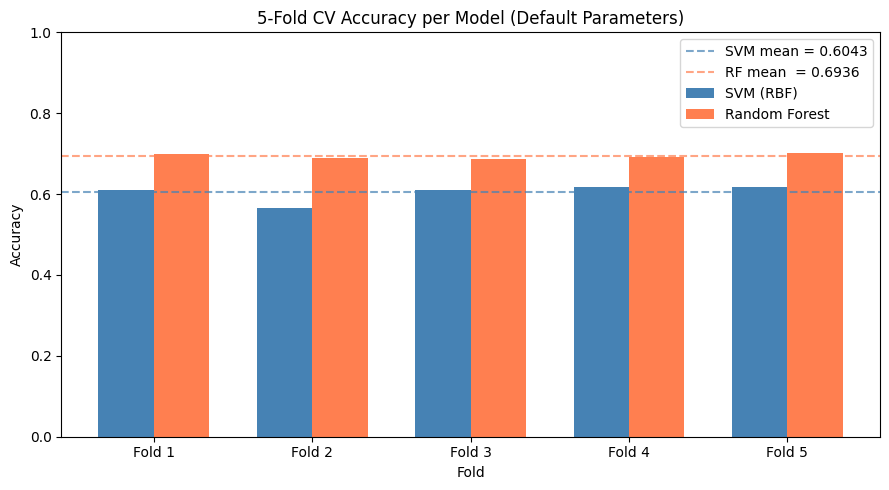

In [87]:
# Visualize CV fold accuracy per model
fig, ax = plt.subplots(figsize=(9, 5))
folds_x = np.arange(1, 6)
width = 0.35

ax.bar(folds_x - width / 2, cv_scores_svm, width, label='SVM (RBF)', color='steelblue')
ax.bar(folds_x + width / 2, cv_scores_rf,  width, label='Random Forest', color='coral')

ax.axhline(cv_scores_svm.mean(), color='steelblue', linestyle='--', alpha=0.7,
           label=f'SVM mean = {cv_scores_svm.mean():.4f}')
ax.axhline(cv_scores_rf.mean(),  color='coral',     linestyle='--', alpha=0.7,
           label=f'RF mean  = {cv_scores_rf.mean():.4f}')

ax.set_xticks(folds_x)
ax.set_xticklabels([f'Fold {i}' for i in folds_x])
ax.set_xlabel('Fold')
ax.set_ylabel('Accuracy')
ax.set_title('5-Fold CV Accuracy per Model (Default Parameters)')
ax.set_ylim(0, 1)
ax.legend()

plt.tight_layout()
plt.show()

## **7.2 GridSearchCV Hyperparameter Tuning**

In [88]:
# SVM hyperparameter tuning using f1_weighted scoring
# Evaluates multiple C and gamma values for optimal generalization
param_grid_svm = {
    'C': [1, 10, 100],
    'gamma': ['scale', 0.01]
}

print('SVM parameter grid:')
for k, v in param_grid_svm.items():
    print(f'{k}: {v}')
print(f'Total combinations: {len(param_grid_svm["C"]) * len(param_grid_svm["gamma"])} x 5 folds = {len(param_grid_svm["C"]) * len(param_grid_svm["gamma"]) * 5} fits')
print('Scoring metric: f1_weighted (consistent with RF tuning)')


SVM parameter grid:
C: [1, 10, 100]
gamma: ['scale', 0.01]
Total combinations: 6 x 5 folds = 30 fits
Scoring metric: f1_weighted (consistent with RF tuning)


In [89]:
# Hyperparameter tuning on a stratified subset before full-data training
GS_SUBSET_N = 3000

X_gs, _, y_gs, _ = train_test_split(
    X_train_fusion, y_train,
    train_size=GS_SUBSET_N,
    stratify=y_train,
    random_state=42
)

print(f'GridSearchCV subset: {X_gs.shape[0]} samples')
print(f'Class distribution: {dict(zip(*np.unique(y_gs, return_counts=True)))}')
print()

grid_svm = GridSearchCV(
    SVC(kernel='rbf', probability=True, class_weight='balanced', random_state=42),
    param_grid_svm,
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
    scoring='f1_weighted',
    n_jobs=-1,
    verbose=1
)

print('Starting SVM GridSearchCV on subset...')
grid_svm.fit(X_gs, y_gs)

print()
print('Best SVM parameters:', grid_svm.best_params_)
print('Best SVM CV f1_weighted:', round(grid_svm.best_score_, 4), '(on subset)')

# Refit best hyperparameters on full training set
best_svm = SVC(
    kernel='rbf',
    probability=True,
    class_weight='balanced',
    random_state=42,
    **grid_svm.best_params_
)

print()
print('Refitting best SVM on full training set...')
best_svm.fit(X_train_fusion, y_train)
print('SVM training complete.')


GridSearchCV subset: 3000 samples
Class distribution: {np.int32(0): np.int64(873), np.int32(1): np.int64(763), np.int32(2): np.int64(682), np.int32(3): np.int64(682)}

Starting SVM GridSearchCV on subset...
Fitting 5 folds for each of 6 candidates, totalling 30 fits

Best SVM parameters: {'C': 10, 'gamma': 'scale'}
Best SVM CV f1_weighted: 0.6399 (on subset)

Refitting best SVM on full training set...
SVM training complete.


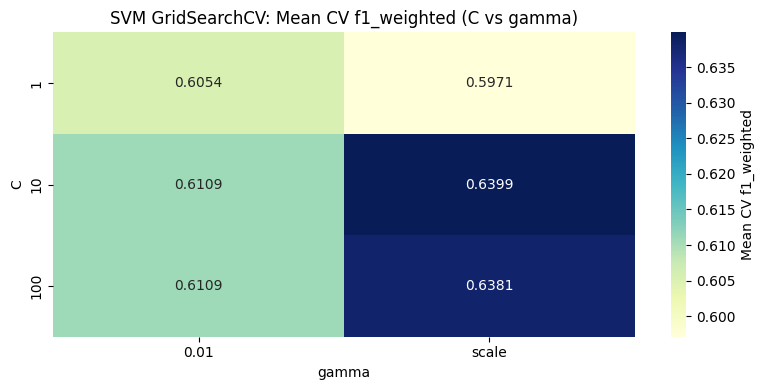

In [90]:
# Visualize SVM GridSearchCV heatmap
cv_results_svm = pd.DataFrame(grid_svm.cv_results_)
pivot_svm = cv_results_svm.pivot_table(
    values='mean_test_score',
    index='param_C',
    columns='param_gamma'
)

plt.figure(figsize=(8, 4))
sns.heatmap(pivot_svm, annot=True, fmt='.4f', cmap='YlGnBu',
            cbar_kws={'label': 'Mean CV f1_weighted'})
plt.title('SVM GridSearchCV: Mean CV f1_weighted (C vs gamma)')
plt.xlabel('gamma')
plt.ylabel('C')
plt.tight_layout()
plt.show()


In [91]:
# Random Forest hyperparameter tuning with f1_weighted scoring
param_grid_rf = {
    'n_estimators': [200, 300],
    'max_depth': [None, 40],
    'min_samples_split': [2, 5],
    'max_features': ['sqrt', 'log2']
}

n_combos = 2 * 2 * 2 * 2
print('Random Forest parameter grid:')
for k, v in param_grid_rf.items():
    print(f'{k}: {v}')
print(f'Total combinations: {n_combos} x 5 folds = {n_combos * 5} fits')
print('Scoring metric: f1_weighted')


Random Forest parameter grid:
n_estimators: [200, 300]
max_depth: [None, 40]
min_samples_split: [2, 5]
max_features: ['sqrt', 'log2']
Total combinations: 16 x 5 folds = 80 fits
Scoring metric: f1_weighted


In [92]:
# Tune Random Forest hyperparameters on the full training set
grid_rf = GridSearchCV(
    RandomForestClassifier(class_weight='balanced', random_state=42, n_jobs=-1),
    param_grid_rf,
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
    scoring='f1_weighted',
    refit=True,
    n_jobs=-1,
    verbose=1
)

print('Starting Random Forest GridSearchCV on full training set...')
grid_rf.fit(X_train_fusion, y_train)

best_rf = grid_rf.best_estimator_
print()
print('Best RF parameters:', grid_rf.best_params_)
print('Best RF CV f1_weighted:', round(grid_rf.best_score_, 4))
print('Random Forest training complete.')


Starting Random Forest GridSearchCV on full training set...
Fitting 5 folds for each of 16 candidates, totalling 80 fits

Best RF parameters: {'max_depth': 40, 'max_features': 'sqrt', 'min_samples_split': 2, 'n_estimators': 300}
Best RF CV f1_weighted: 0.7042
Random Forest training complete.


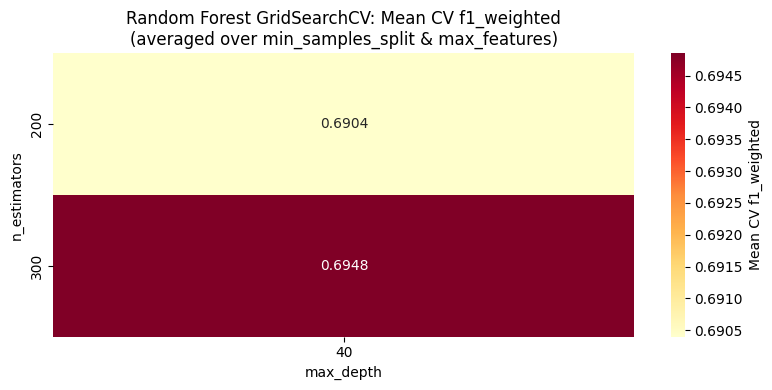

In [93]:
# Visualize RF GridSearchCV heatmap (n_estimators vs max_depth)
cv_results_rf = pd.DataFrame(grid_rf.cv_results_)
pivot_rf = cv_results_rf.pivot_table(
    values='mean_test_score',
    index='param_n_estimators',
    columns='param_max_depth'
)

plt.figure(figsize=(8, 4))
sns.heatmap(pivot_rf, annot=True, fmt='.4f', cmap='YlOrRd',
            cbar_kws={'label': 'Mean CV f1_weighted'})
plt.title('Random Forest GridSearchCV: Mean CV f1_weighted\n(averaged over min_samples_split & max_features)')
plt.xlabel('max_depth')
plt.ylabel('n_estimators')
plt.tight_layout()
plt.show()


In [94]:
# Model summary after full training
print('Model summary:')
print(f'SVM (RBF): C={best_svm.C}, gamma={best_svm.gamma}')
print(f'Random Forest: n_estimators={best_rf.n_estimators}, max_depth={best_rf.max_depth},')
print(f'               min_samples_split={best_rf.min_samples_split}, max_features={best_rf.max_features}')
print()
print('Both models fitted on full X_train_fusion.')
print(f'Training set size: {X_train_fusion.shape[0]} samples, {X_train_fusion.shape[1]} features')


Model summary:
SVM (RBF): C=10, gamma=scale
Random Forest: n_estimators=300, max_depth=40,
               min_samples_split=2, max_features=sqrt

Both models fitted on full X_train_fusion.
Training set size: 30800 samples, 490 features


In [95]:
# Validate both models on the held-out validation set
from sklearn.metrics import accuracy_score, classification_report
val_acc_svm = accuracy_score(y_val, best_svm.predict(X_val_fusion))
val_acc_rf = accuracy_score(y_val, best_rf.predict(X_val_fusion))

print('Validation accuracy after full training:')
print(f'SVM (RBF): {val_acc_svm:.4f}')
print(f'Random Forest: {val_acc_rf:.4f}')
print()
print('Both models ready for Stage 8 evaluation on the held-out test set.')


Validation accuracy after full training:
SVM (RBF): 0.8639
Random Forest: 0.7170

Both models ready for Stage 8 evaluation on the held-out test set.


# **Stage 8: Evaluation**

Model performance is evaluated using the following metrics.
| Metric | Purpose |
|--------|---------|
| Accuracy | Overall classification correctness |
| Weighted F1-Score | Class-level precision-recall balance |
| Precision and Recall | Per-class analysis, important for early-stage classes |
| Area Under the Receiver Operating Characteristic Curve (AUC-ROC) | Per-class discriminative capability across decision thresholds |
| Confusion Matrix | Inter-class misclassification patterns between<br>neighboring severity levels |

## **8.1 Accuracy**

Test Set Accuracy:
SVM (RBF, Tuned): 0.8641
Random Forest: 0.7214


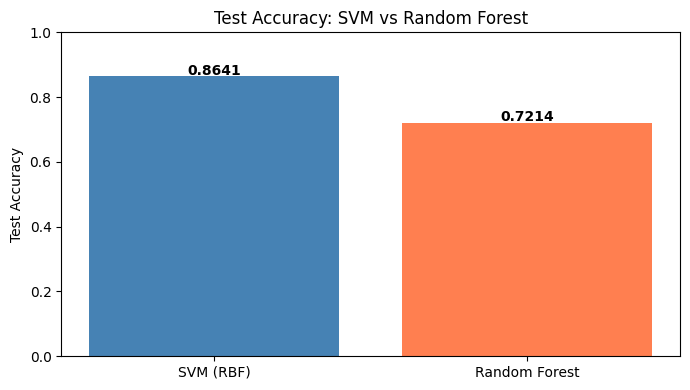

In [96]:
# Evaluate on test set
y_test_pred_svm = best_svm.predict(X_test_fusion)
y_test_pred_rf  = best_rf.predict(X_test_fusion)
acc_test_svm = accuracy_score(y_test, y_test_pred_svm)
acc_test_rf  = accuracy_score(y_test, y_test_pred_rf)

print("Test Set Accuracy:")
print(f"SVM (RBF, Tuned): {acc_test_svm:.4f}")
print(f"Random Forest: {acc_test_rf:.4f}")

# Bar chart
fig, ax = plt.subplots(figsize=(7, 4))
bars = ax.bar(['SVM (RBF)', 'Random Forest'], [acc_test_svm, acc_test_rf],
               color=['steelblue', 'coral'])
for bar, val in zip(bars, [acc_test_svm, acc_test_rf]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
            f'{val:.4f}', ha='center', fontweight='bold')
ax.set_ylim(0, 1)
ax.set_ylabel('Test Accuracy')
ax.set_title('Test Accuracy: SVM vs Random Forest')
plt.tight_layout()
plt.show()

## **8.2 Weighted F1-Score**

Weighted F1-Score (Test Set):
SVM (RBF): 0.8638
Random Forest: 0.7181


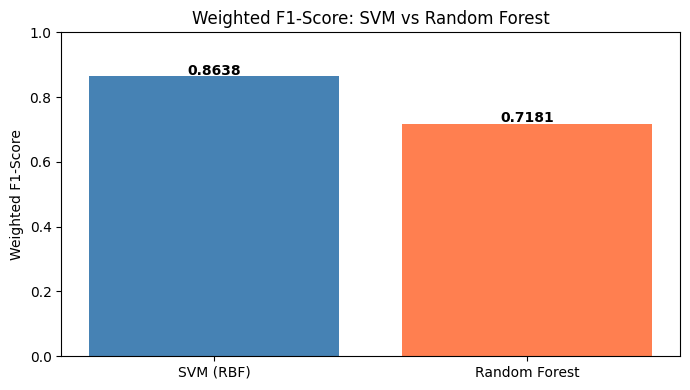

In [97]:
from sklearn.metrics import f1_score

f1_svm = f1_score(y_test, y_test_pred_svm, average='weighted')
f1_rf  = f1_score(y_test, y_test_pred_rf,  average='weighted')

print("Weighted F1-Score (Test Set):")
print(f"SVM (RBF): {f1_svm:.4f}")
print(f"Random Forest: {f1_rf:.4f}")

fig, ax = plt.subplots(figsize=(7, 4))
bars = ax.bar(['SVM (RBF)', 'Random Forest'], [f1_svm, f1_rf],
               color=['steelblue', 'coral'])
for bar, val in zip(bars, [f1_svm, f1_rf]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
            f'{val:.4f}', ha='center', fontweight='bold')
ax.set_ylim(0, 1)
ax.set_ylabel('Weighted F1-Score')
ax.set_title('Weighted F1-Score: SVM vs Random Forest')
plt.tight_layout()
plt.show()

## **8.3 Precision and Recall**

SVM Classification Report (Test Set)
                  precision    recall  f1-score   support

     NonDemented       0.84      0.84      0.84      1920
VeryMildDemented       0.80      0.78      0.79      1680
    MildDemented       0.85      0.87      0.86      1500
ModerateDemented       0.98      0.99      0.98      1500

        accuracy                           0.86      6600
       macro avg       0.87      0.87      0.87      6600
    weighted avg       0.86      0.86      0.86      6600

Random Forest Classification Report (Test Set)
                  precision    recall  f1-score   support

     NonDemented       0.69      0.73      0.71      1920
VeryMildDemented       0.67      0.54      0.60      1680
    MildDemented       0.65      0.72      0.68      1500
ModerateDemented       0.88      0.91      0.90      1500

        accuracy                           0.72      6600
       macro avg       0.72      0.73      0.72      6600
    weighted avg       0.72      0.72    

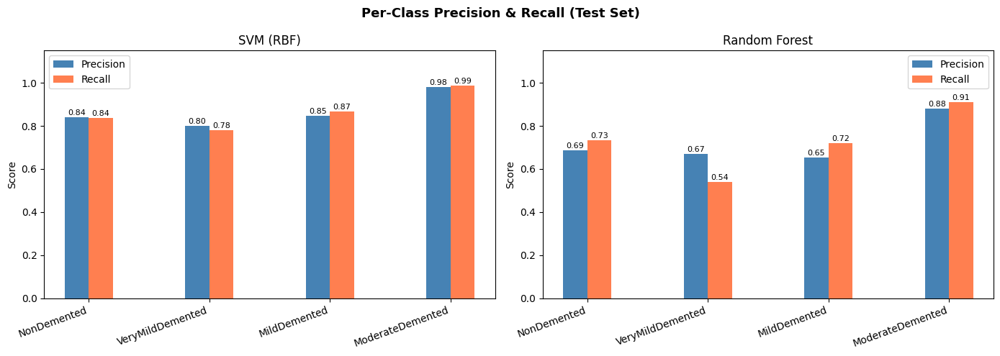


Inter-class misclassification analysis (SVM):
True NonDemented            -> Predicted VeryMildDemented      :   218 (11.4%)
True NonDemented            -> Predicted MildDemented          :    87 (4.5%)
True NonDemented            -> Predicted ModerateDemented      :     6 (0.3%)
True VeryMildDemented       -> Predicted NonDemented           :   222 (13.2%)
True VeryMildDemented       -> Predicted MildDemented          :   139 (8.3%)
True VeryMildDemented       -> Predicted ModerateDemented      :     8 (0.5%)
True MildDemented           -> Predicted NonDemented           :    82 (5.5%)
True MildDemented           -> Predicted VeryMildDemented      :   103 (6.9%)
True MildDemented           -> Predicted ModerateDemented      :    15 (1.0%)
True ModerateDemented       -> Predicted NonDemented           :     4 (0.3%)
True ModerateDemented       -> Predicted VeryMildDemented      :     6 (0.4%)
True ModerateDemented       -> Predicted MildDemented          :     7 (0.5%)

Inter-class mi

In [98]:
class_names = ['NonDemented', 'VeryMildDemented', 'MildDemented', 'ModerateDemented']

print("SVM Classification Report (Test Set)")
print(classification_report(y_test, y_test_pred_svm, target_names=class_names))

print("Random Forest Classification Report (Test Set)")
print(classification_report(y_test, y_test_pred_rf, target_names=class_names))

# Per-class precision & recall bar chart
from sklearn.metrics import precision_score, recall_score

prec_svm = precision_score(y_test, y_test_pred_svm, average=None)
rec_svm = recall_score(y_test,  y_test_pred_svm, average=None)
prec_rf = precision_score(y_test, y_test_pred_rf,  average=None)
rec_rf = recall_score(y_test,  y_test_pred_rf,  average=None)

x = np.arange(len(class_names))
width = 0.2

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Per-Class Precision & Recall (Test Set)', fontsize=13, fontweight='bold')

for ax, prec, rec, title in zip(axes,
                                  [prec_svm, prec_rf],
                                  [rec_svm,  rec_rf],
                                  ['SVM (RBF)', 'Random Forest']):
    ax.bar(x - width/2, prec, width, label='Precision', color='steelblue')
    ax.bar(x + width/2, rec,  width, label='Recall',    color='coral')
    ax.set_xticks(x)
    ax.set_xticklabels(class_names, rotation=20, ha='right')
    ax.set_ylim(0, 1.15)
    ax.set_ylabel('Score')
    ax.set_title(title)
    ax.legend()
    for i, (p, r) in enumerate(zip(prec, rec)):
        ax.text(i - width/2, p + 0.01, f'{p:.2f}', ha='center', fontsize=8)
        ax.text(i + width/2, r + 0.01, f'{r:.2f}', ha='center', fontsize=8)

plt.tight_layout()
plt.show()

# Inter-class misclassification analysis (per proposal Stage 8 requirement)
print()
print('Inter-class misclassification analysis (SVM):')
cm_svm_raw = confusion_matrix(y_test, y_test_pred_svm)
for i in range(4):
    for j in range(4):
        if i != j and cm_svm_raw[i, j] > 0:
            pct = cm_svm_raw[i, j] / cm_svm_raw[i].sum() * 100
            print(f'True {class_names[i]:<22} -> Predicted {class_names[j]:<22}: '
                  f'{cm_svm_raw[i,j]:>5} ({pct:.1f}%)')

print()
print('Inter-class misclassification analysis (Random Forest):')
cm_rf_raw = confusion_matrix(y_test, y_test_pred_rf)
for i in range(4):
    for j in range(4):
        if i != j and cm_rf_raw[i, j] > 0:
            pct = cm_rf_raw[i, j] / cm_rf_raw[i].sum() * 100
            print(f'True {class_names[i]:<22} -> Predicted {class_names[j]:<22}: '
                  f'{cm_rf_raw[i,j]:>5} ({pct:.1f}%)')


## **8.4 Area Under the Receiver Operating Characteristic Curve (AUC-ROC)**

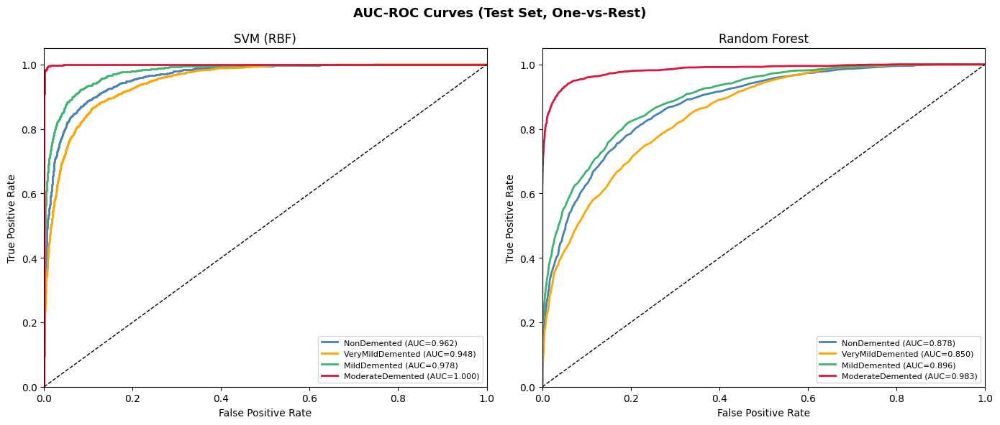


SVM - AUC per class:
  NonDemented: 0.9619
  VeryMildDemented: 0.9479
  MildDemented: 0.9775
  ModerateDemented: 0.9996

Random Forest - AUC per class:
  NonDemented: 0.8777
  VeryMildDemented: 0.8504
  MildDemented: 0.8959
  ModerateDemented: 0.9833


In [99]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize labels for multiclass ROC
y_test_bin = label_binarize(y_test, classes=[0, 1, 2, 3])

# Probability predictions
y_prob_svm = best_svm.predict_proba(X_test_fusion)
y_prob_rf  = best_rf.predict_proba(X_test_fusion)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('AUC-ROC Curves (Test Set, One-vs-Rest)', fontsize=13, fontweight='bold')

colors_roc = ['steelblue', 'orange', 'mediumseagreen', 'crimson']

for ax, y_prob, title in zip(axes, [y_prob_svm, y_prob_rf], ['SVM (RBF)', 'Random Forest']):
    for i, (cls, color) in enumerate(zip(class_names, colors_roc)):
        fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_prob[:, i])
        roc_auc = auc(fpr, tpr)
        ax.plot(fpr, tpr, color=color, lw=2, label=f'{cls} (AUC={roc_auc:.3f})')
    ax.plot([0, 1], [0, 1], 'k--', lw=1)
    ax.set_xlim([0, 1])
    ax.set_ylim([0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title(title)
    ax.legend(loc='lower right', fontsize=8)

plt.tight_layout()
plt.show()

# Print AUC per class
for name, y_prob in [('SVM', y_prob_svm), ('Random Forest', y_prob_rf)]:
    print(f"\n{name} - AUC per class:")
    for i, cls in enumerate(class_names):
        fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_prob[:, i])
        print(f"  {cls}: {auc(fpr, tpr):.4f}")

## **8.5 Confusion Matrix**

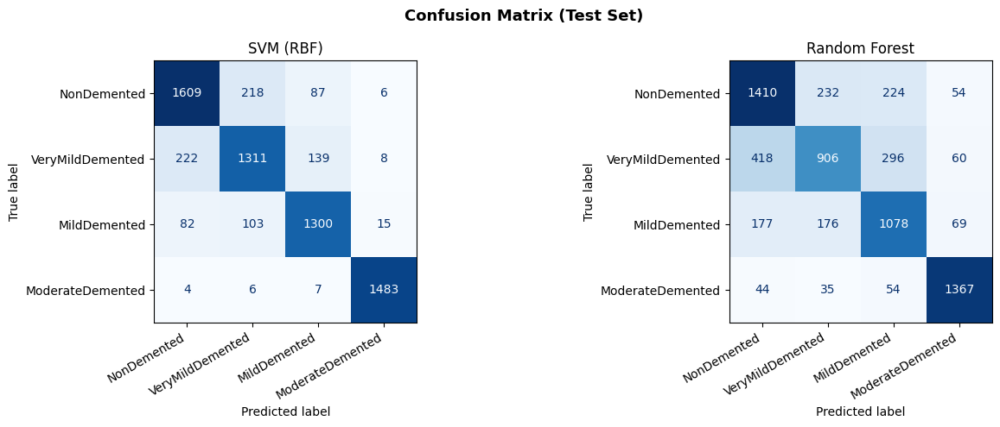

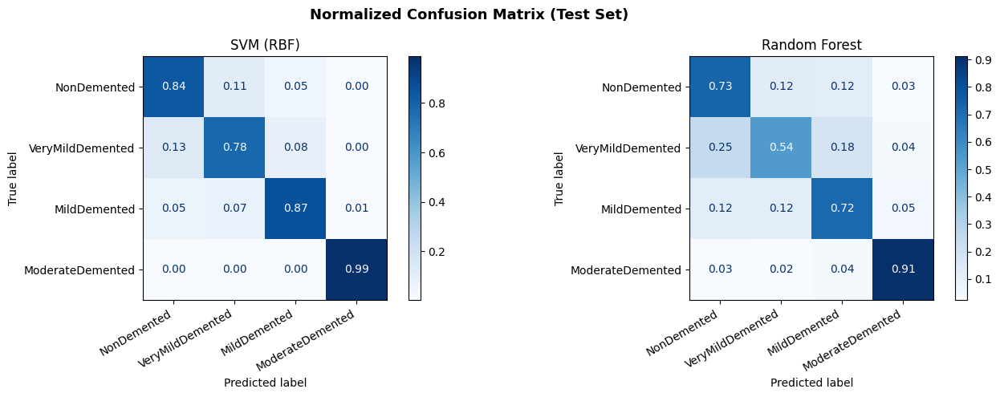

Per-class recall from confusion matrix (SVM):
NonDemented           :0.8380
VeryMildDemented      :0.7804
MildDemented          :0.8667
ModerateDemented      :0.9887

Per-class recall from confusion matrix (Random Forest):
NonDemented           :0.7344
VeryMildDemented      :0.5393
MildDemented          :0.7187
ModerateDemented      :0.9113


In [100]:
from sklearn.metrics import ConfusionMatrixDisplay

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Confusion Matrix (Test Set)', fontsize=13, fontweight='bold')

for ax, y_pred, title in zip(axes,
                               [y_test_pred_svm, y_test_pred_rf],
                               ['SVM (RBF)', 'Random Forest']):
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
    disp.plot(ax=ax, cmap='Blues', colorbar=False)
    ax.set_title(title)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')

plt.tight_layout()
plt.show()

# Normalized confusion matrix (recall per class)
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Normalized Confusion Matrix (Test Set)', fontsize=13, fontweight='bold')

for ax, y_pred, title in zip(axes,
                               [y_test_pred_svm, y_test_pred_rf],
                               ['SVM (RBF)', 'Random Forest']):
    cm = confusion_matrix(y_test, y_pred, normalize='true')
    disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
    disp.plot(ax=ax, cmap='Blues', colorbar=True, values_format='.2f')
    ax.set_title(title)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')

plt.tight_layout()
plt.show()

# Summary statistics from confusion matrices
class_names_cm = ['NonDemented', 'VeryMildDemented', 'MildDemented', 'ModerateDemented']
print('Per-class recall from confusion matrix (SVM):')
cm_s = confusion_matrix(y_test, y_test_pred_svm)
for i, cls in enumerate(class_names_cm):
    recall = cm_s[i, i] / cm_s[i].sum()
    print(f'{cls:<22}:{recall:.4f}')
print()
print('Per-class recall from confusion matrix (Random Forest):')
cm_r = confusion_matrix(y_test, y_test_pred_rf)
for i, cls in enumerate(class_names_cm):
    recall = cm_r[i, i] / cm_r[i].sum()
    print(f'{cls:<22}:{recall:.4f}')


# **Stage 9: Interpretability**

3 methods applied to ensure accurate, transparent, and clinically meaningful results.
| Method | Scope | Output |
|--------|-------|--------|
| SHapley Additive exPlanations (SHAP) | Global + local | Feature contribution per prediction to identify most<br>influential features per class |
| RF Feature Importance | Global | Ranks all features by aggregate discriminative<br>contribution across the full dataset |
| Principal Component Analysis (PCA) Visualization | Global | Projects 300-dimensional feature space into 2D to<br>validate class separability |
| t-distributed Stochastic Neighbor Embedding (t-SNE) Visualization | Global | Projects feature space into 2D by highlighting<br>cluster cohesion |

After generating the prediction, best model, evaluation, and interpretation results are generated, an interactive dashboard is constructed to classify Alzheimer's severity.

## **9.1 SHapley Additive exPlanations (SHAP)**

Computing SHAP values for Random Forest (TreeExplainer)...
SHAP array shape: (300, 490, 4)


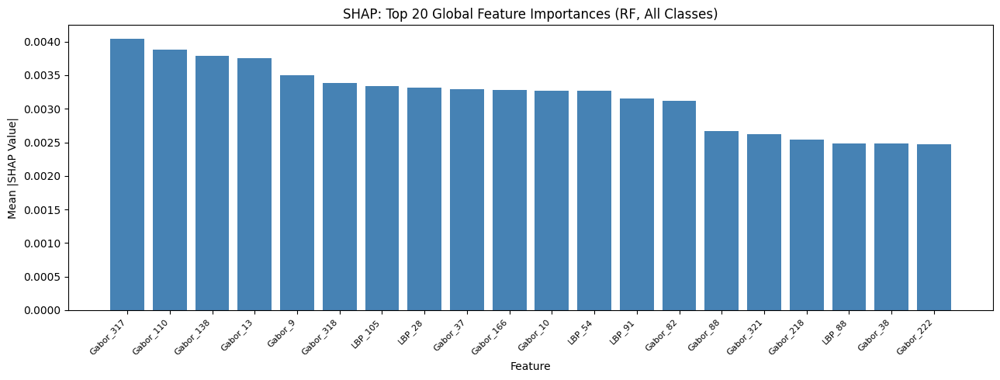

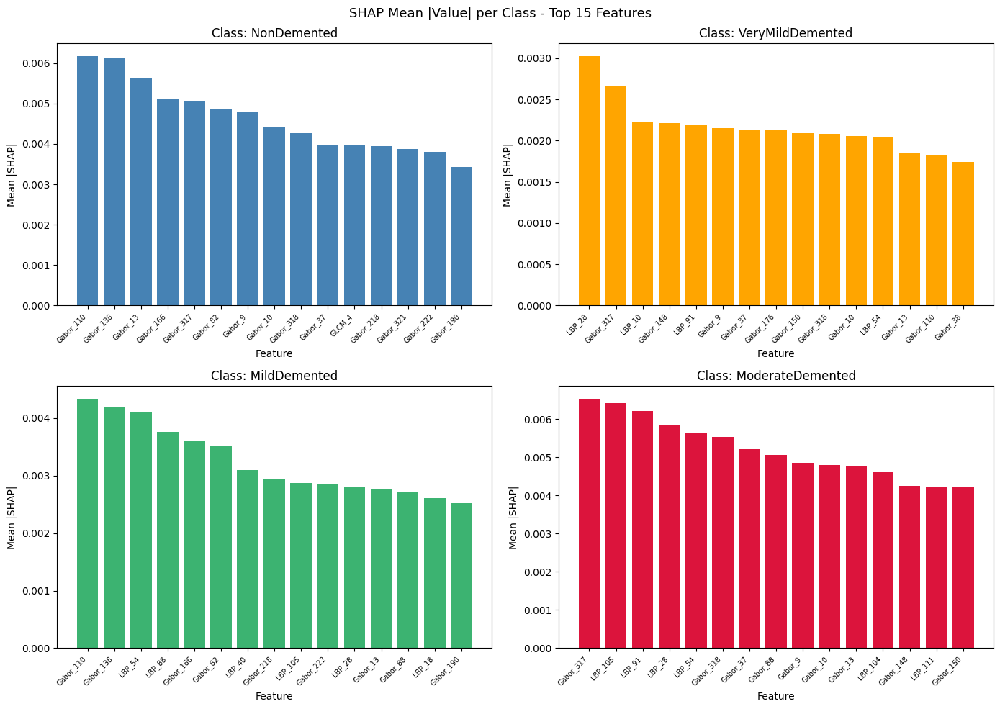

In [101]:
# SHAP for Random Forest (TreeExplainer) with robust indexing and feature names
import shap
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
print('Computing SHAP values for Random Forest (TreeExplainer)...')
explainer_rf = shap.TreeExplainer(best_rf)
N_SHAP = min(300, len(X_test_fusion))
X_shap = X_test_fusion[:N_SHAP]

# Build feature names matching fusion vector order
f_gabor_s = extract_gabor_features(sample_img)
f_lbp_s = extract_lbp_features(sample_img)
f_glcm_s = extract_glcm_features(sample_img)
feature_names = (
    [f'Gabor_{i}' for i in range(len(f_gabor_s))] +
    [f'LBP_{i}' for i in range(len(f_lbp_s))] +
    [f'GLCM_{i}' for i in range(len(f_glcm_s))]
)
shap_values_rf = explainer_rf.shap_values(X_shap)

# Handle both old (list) and new (3D array) SHAP output formats
if isinstance(shap_values_rf, list):
    shap_arr = np.stack(shap_values_rf, axis=2)   # (N, features, n_classes)
else:
    shap_arr = np.array(shap_values_rf)
print(f'SHAP array shape: {shap_arr.shape}')

# Global bar: mean |SHAP| across all classes
mean_abs_shap = np.abs(shap_arr).mean(axis=0)
global_importance = mean_abs_shap.mean(axis=1) if mean_abs_shap.ndim == 2 else mean_abs_shap
top_k = 20
top_idx = np.argsort(global_importance)[::-1][:top_k]
fig, ax = plt.subplots(figsize=(13, 5))
ax.bar(range(top_k), global_importance[top_idx], color='steelblue')
ax.set_xticks(range(top_k))
ax.set_xticklabels([feature_names[i] for i in top_idx], rotation=45, ha='right', fontsize=8)
ax.set_xlabel('Feature')
ax.set_ylabel('Mean |SHAP Value|')
ax.set_title(f'SHAP: Top {top_k} Global Feature Importances (RF, All Classes)')
plt.tight_layout()
plt.show()

# Per-class SHAP bar (2x2 grid)
class_names_eval = ['NonDemented', 'VeryMildDemented', 'MildDemented', 'ModerateDemented']
colors_shap = ['steelblue', 'orange', 'mediumseagreen', 'crimson']
if shap_arr.ndim == 3:
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    fig.suptitle('SHAP Mean |Value| per Class - Top 15 Features', fontsize=13)
    for cls_idx, (cls_name, ax, color) in enumerate(
            zip(class_names_eval, axes.ravel(), colors_shap)):
        sv_cls = np.abs(shap_arr[:, :, cls_idx]).mean(axis=0)
        top_idx_cls = np.argsort(sv_cls)[::-1][:15]
        ax.bar(range(15), sv_cls[top_idx_cls], color=color)
        ax.set_xticks(range(15))
        ax.set_xticklabels([feature_names[i] for i in top_idx_cls],
                           rotation=45, ha='right', fontsize=7)
        ax.set_xlabel('Feature')
        ax.set_ylabel('Mean |SHAP|')
        ax.set_title(f'Class: {cls_name}')
    plt.tight_layout()
    plt.show()


Computing SHAP values for SVM (KernelExplainer, 50 samples)...


100%|██████████| 50/50 [55:45<00:00, 66.91s/it]


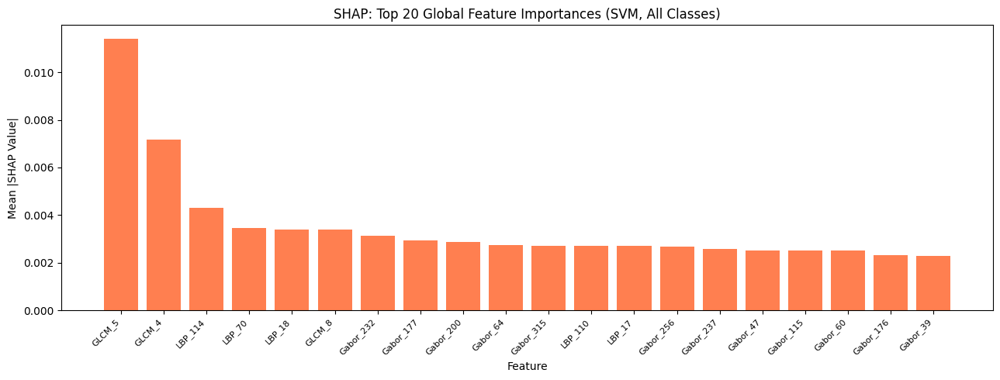

In [102]:
# SVM SHAP via KernelExplainer 
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings('ignore', category=ConvergenceWarning)
warnings.filterwarnings('ignore', category=FutureWarning)

print('Computing SHAP values for SVM (KernelExplainer, 50 samples)...')
background = shap.kmeans(X_train_fusion, 50)
N_SHAP_SVM = min(50, len(X_test_fusion))
X_shap_svm = X_test_fusion[:N_SHAP_SVM]
explainer_svm = shap.KernelExplainer(best_svm.predict_proba, background)
shap_values_svm = explainer_svm.shap_values(X_shap_svm, nsamples=200)


# Handle list vs array
if isinstance(shap_values_svm, list):
    shap_svm_arr = np.stack(shap_values_svm, axis=2)
else:
    shap_svm_arr = np.array(shap_values_svm)

mean_abs_svm = np.abs(shap_svm_arr).mean(axis=0)
global_svm = mean_abs_svm.mean(axis=1) if mean_abs_svm.ndim == 2 else mean_abs_svm
top_k = 20
top_idx_svm = np.argsort(global_svm)[::-1][:top_k]

fig, ax = plt.subplots(figsize=(13, 5))
ax.bar(range(top_k), global_svm[top_idx_svm], color='coral')
ax.set_xticks(range(top_k))
ax.set_xticklabels([feature_names[i] for i in top_idx_svm],
                   rotation=45, ha='right', fontsize=8)
ax.set_xlabel('Feature')
ax.set_ylabel('Mean |SHAP Value|')
ax.set_title(f'SHAP: Top {top_k} Global Feature Importances (SVM, All Classes)')
plt.tight_layout()
plt.show()

## **9.2 Random Forest Feature Importance**

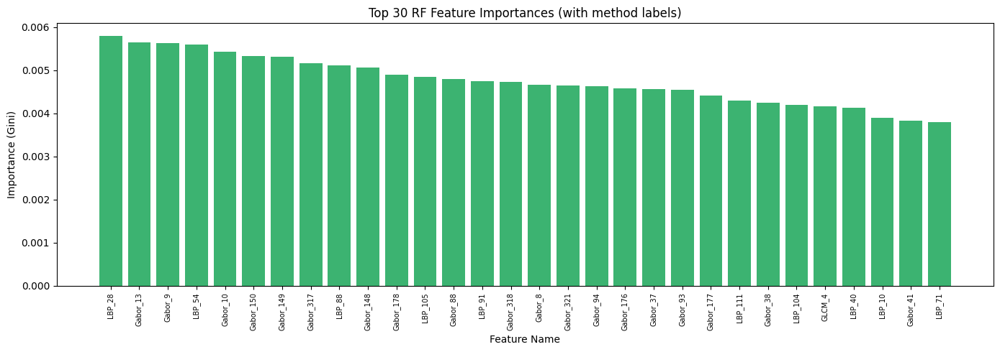

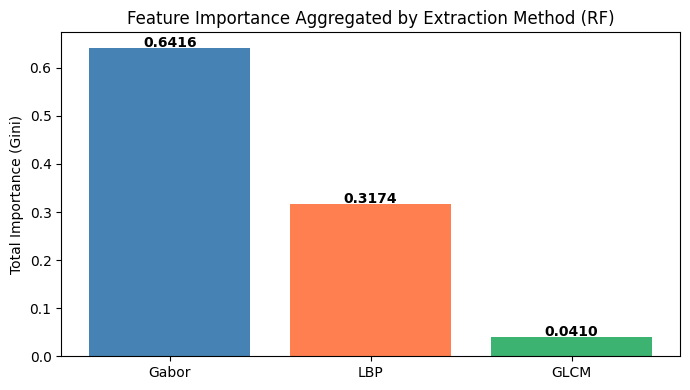

Top 10 most important features:
Rank  Feature      Importance
1     LBP_28       0.005800
2     Gabor_13     0.005649
3     Gabor_9      0.005630
4     LBP_54       0.005588
5     Gabor_10     0.005424
6     Gabor_150    0.005322
7     Gabor_149    0.005305
8     Gabor_317    0.005159
9     LBP_88       0.005109
10    Gabor_148    0.005059

Importance by method:
Gabor: 0.6416
LBP: 0.3174
GLCM: 0.0410


In [103]:
# RF Feature Importance with proper feature names and method grouping
importances = best_rf.feature_importances_
f_gabor_s = extract_gabor_features(sample_img)
f_lbp_s = extract_lbp_features(sample_img)
f_glcm_s = extract_glcm_features(sample_img)
feature_names = (
    [f'Gabor_{i}' for i in range(len(f_gabor_s))] +
    [f'LBP_{i}' for i in range(len(f_lbp_s))] +
    [f'GLCM_{i}' for i in range(len(f_glcm_s))]
)

indices = np.argsort(importances)[::-1]
TOP_N = 30

plt.figure(figsize=(14, 5))
plt.bar(range(TOP_N), importances[indices[:TOP_N]], color='mediumseagreen')
plt.xticks(range(TOP_N),
           [feature_names[indices[i]] for i in range(TOP_N)],
           rotation=90, fontsize=7)
plt.xlabel('Feature Name')
plt.ylabel('Importance (Gini)')
plt.title(f'Top {TOP_N} RF Feature Importances (with method labels)')
plt.tight_layout()
plt.show()

# Aggregated importance by extraction method
n_gabor = len(f_gabor_s)
n_lbp = len(f_lbp_s)
n_glcm = len(f_glcm_s)

imp_gabor = importances[:n_gabor].sum()
imp_lbp = importances[n_gabor:n_gabor + n_lbp].sum()
imp_glcm = importances[n_gabor + n_lbp:].sum()

fig, ax = plt.subplots(figsize=(7, 4))
bars_m = ax.bar(['Gabor', 'LBP', 'GLCM'],
                [imp_gabor, imp_lbp, imp_glcm],
                color=['steelblue', 'coral', 'mediumseagreen'])
for b, v in zip(bars_m, [imp_gabor, imp_lbp, imp_glcm]):
    ax.text(b.get_x() + b.get_width()/2, v + 0.001,
            f'{v:.4f}', ha='center', fontweight='bold')
ax.set_ylabel('Total Importance (Gini)')
ax.set_title('Feature Importance Aggregated by Extraction Method (RF)')
plt.tight_layout()
plt.show()

print('Top 10 most important features:')
print(f'{"Rank":<5} {"Feature":<12} {"Importance"}')
for rank, idx in enumerate(indices[:10], 1):
    print(f'{rank:<5} {feature_names[idx]:<12} {importances[idx]:.6f}')

print(f'\nImportance by method:')
print(f'Gabor: {imp_gabor:.4f}')
print(f'LBP: {imp_lbp:.4f}')
print(f'GLCM: {imp_glcm:.4f}')


## **9.3 Principal Component Analysis (PCA) Visualization**

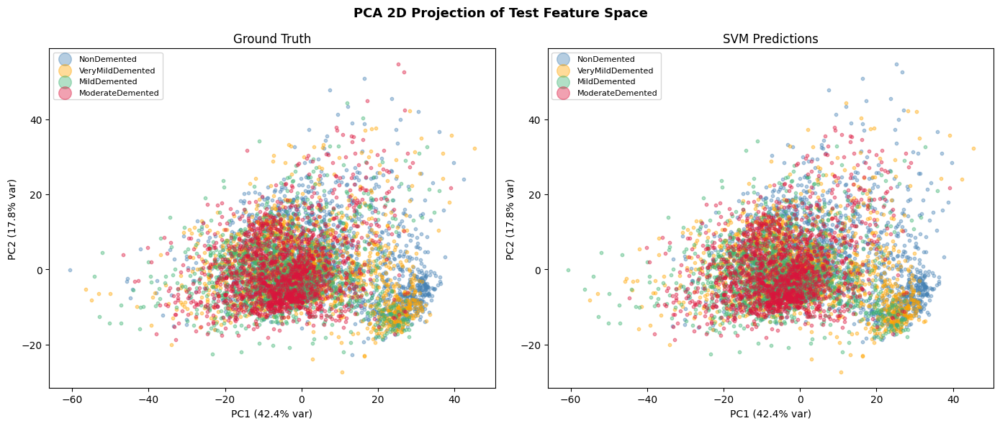

Explained variance ratio: PC1=0.4241, PC2=0.1783
Total variance explained: 0.6024


In [104]:
pca_2d = PCA(n_components=2, random_state=42)
X_test_pca = pca_2d.fit_transform(X_test_fusion)
colors_pca = ['steelblue', 'orange', 'mediumseagreen', 'crimson']
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('PCA 2D Projection of Test Feature Space', fontsize=13, fontweight='bold')

for ax, labels, title in zip(axes,
                               [y_test, y_test_pred_svm],
                               ['Ground Truth', 'SVM Predictions']):
    for i, (cls, color) in enumerate(zip(class_names, colors_pca)):
        mask = np.array(labels) == i
        ax.scatter(X_test_pca[mask, 0], X_test_pca[mask, 1],
                   alpha=0.4, s=10, label=cls, color=color)
    ax.set_xlabel(f'PC1 ({pca_2d.explained_variance_ratio_[0]*100:.1f}% var)')
    ax.set_ylabel(f'PC2 ({pca_2d.explained_variance_ratio_[1]*100:.1f}% var)')
    ax.set_title(title)
    ax.legend(markerscale=4, fontsize=8)
plt.tight_layout()
plt.show()

print(f"Explained variance ratio: PC1={pca_2d.explained_variance_ratio_[0]:.4f}, "
      f"PC2={pca_2d.explained_variance_ratio_[1]:.4f}")
print(f"Total variance explained: {sum(pca_2d.explained_variance_ratio_):.4f}")

## **9.4 t-distributed Stochastic Neighbor Embedding (t-SNE) Visualization**

Running t-SNE on 1500 samples (perplexity=30)...


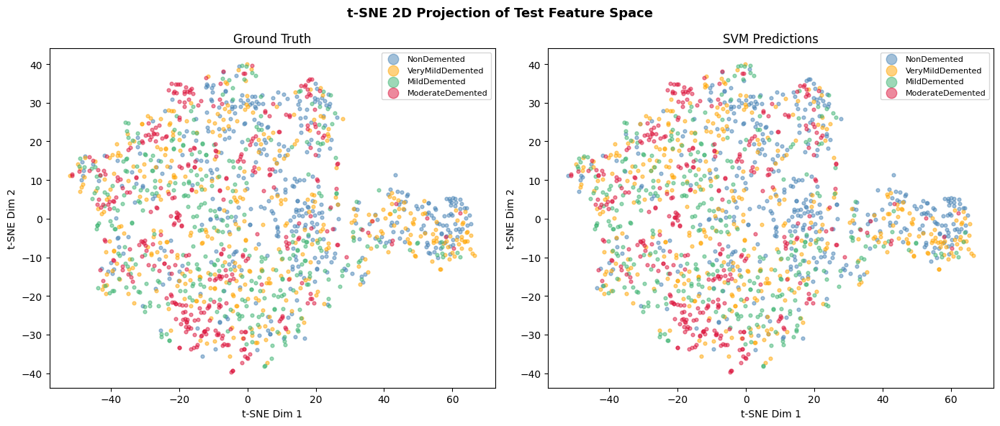

In [105]:
# t-SNE visualization with max_iter 
from sklearn.manifold import TSNE
N_TSNE = min(1500, len(X_test_fusion))
X_tsne_input = X_test_fusion[:N_TSNE]
y_tsne_true = y_test[:N_TSNE]
y_tsne_pred = y_test_pred_svm[:N_TSNE]

colors_pca = ['steelblue', 'orange', 'mediumseagreen', 'crimson']

print(f'Running t-SNE on {N_TSNE} samples (perplexity=30)...')
tsne = TSNE(n_components=2, perplexity=30, random_state=42, max_iter=1000)
X_tsne = tsne.fit_transform(X_tsne_input)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('t-SNE 2D Projection of Test Feature Space', fontsize=13, fontweight='bold')

for ax, labels, title in zip(axes,
                               [y_tsne_true, y_tsne_pred],
                               ['Ground Truth', 'SVM Predictions']):
    for i, (cls, color) in enumerate(zip(class_names, colors_pca)):
        mask = np.array(labels) == i
        ax.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
                   alpha=0.5, s=12, label=cls, color=color)
    ax.set_xlabel('t-SNE Dim 1')
    ax.set_ylabel('t-SNE Dim 2')
    ax.set_title(title)
    ax.legend(markerscale=3, fontsize=8)

plt.tight_layout()
plt.show()

# **Save all for dashboard**

In [106]:
os.makedirs('results', exist_ok=True)

joblib.dump(best_svm, 'results/best_svm.pkl')
joblib.dump(best_rf, 'results/best_rf.pkl')
joblib.dump(scaler_fusion, 'results/scaler_fusion.pkl')
joblib.dump({
    'X_test': X_test_fusion,
    'y_test': list(y_test),
    'y_pred_svm': list(y_test_pred_svm),
    'y_pred_rf': list(y_test_pred_rf),
    'shap_values': shap_arr,
    'feature_names': feature_names,
    'X_test_pca': X_test_pca,
    'X_tsne': X_tsne,
    'acc_svm': acc_test_svm,
    'acc_rf': acc_test_rf,
    'f1_svm': f1_svm,
    'f1_rf': f1_rf,
}, 'results/eval_data.pkl')

print("all files saved")
print(os.listdir('results'))

all files saved
['best_rf.pkl', 'best_svm.pkl', 'eval_data.pkl', 'scaler_fusion.pkl', 'X_test_raw.pkl', 'X_train_raw.pkl', 'X_val_raw.pkl']
